# RFM Customer Segmentation

DBDA.X408.(34) Introduction to Machine Learning
<br>
by Sena Kaya

This is a transnational data set which contains all the transactions occurring between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique all-occasion gifts. Many customers of the company are wholesalers. 
<br>Dataset source: http://archive.ics.uci.edu/dataset/352/online+retail

Feature Information:

**InvoiceNo**: Invoice number. *Nominal*, a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation. 
<br>
**StockCode**: Product (item) code. *Nominal*, a 5-digit integral number uniquely assigned to each distinct product.
<br>
**Description**: Product (item) name. *Nominal*. 
<br>
**Quantity**: The quantities of each product (item) per transaction. *Numeric*.
<br>
**InvoiceDate**: Invoice Date and time. *Numeric*, the day and time when each transaction was generated.
<br>
**UnitPrice**: Unit price. *Numeric*, Product price per unit in sterling.
<br>
**CustomerID**: Customer number. *Nominal*, a 5-digit integral number uniquely assigned to each customer.
<br>
**Country**: Country name. *Nominal*, the name of the country where each customer resides.
<br>
<br>

**RFM**: Recency, Frequency and Monetary


To prepare the data for RFM analysis, conduct exploratory data analysis (EDA) and data visualization to observe data structure and missing values. Perform descriptive analysis to understand feature relationships, clear noise, and address missing values in the dataset, making it ready for RFM analysis. Analyze distribution of Orders, Customers, and Countries before RFM analysis to inform sales policies and resource utilization.

Focus on UK transactions for RFM Analysis, Customer Segmentation, and K-Means Clustering due to its highest sales revenue and customer count. Use RFM Analysis, a customer segmentation technique based on past purchasing behavior, to develop targeted approaches for better customer understanding, trend observation, and increased retention and sales. Calculate Recency, Frequency, and Monetary values for UK transactions to create an RFM table.

In the Customer Segmentation section, create an RFM Segmentation Table to categorize customers based on their RFM values (e.g., "Big Spenders," "Lost Customer").

Compare manual customer segmentation with K-Means, DBSCAN, and Gaussian Mixture Clustering algorithm results to evaluate its effectiveness in customer clustering. Preprocess data for K-Means Clustering, including examining feature correlations, distributions, and normalizing the data. Determine the optimal number of clusters using the Elbow method and Silhouette Analysis. Visualize cluster distribution using a scatter plot and interpret results using boxplots.

# Project Structures
-Data Cleaning & Feature Engineering
<br>
-Exploratory Data Analysis
<br>
-RFM Analysis
<br>
-Customer Segmentation
<br>
-Applying K-Means Clustering
<br>
-Applying DBSCAN Clustering
<br>
-Applying Gaussian Mixture Clustering
<br>

**Data Cleaning & Feature Engineering**

In [1]:
#!conda install -c conda-forge ydata-profiling

In [2]:
import pandas as pd
# from pandas_profiling import ProfileReport
from ydata_profiling import ProfileReport

In [3]:
#importing libraries
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import sklearn.cluster as cluster 
import sklearn.cluster as KMeans
import sklearn.preprocessing as StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import make_blobs
%matplotlib inline
#from pandas_profiling import ProfileReport


In [4]:
#importing dataset
df=pd.read_excel ("/Users/senakaya/Desktop/UCSC/Machine Learning/retail project/Online Retail 2.xlsx")
df.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom


In [5]:
#dimensions of dataset
df.shape

(541909, 8)

In [6]:
#summary of the dataframe's structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [7]:
#descriptive statistics of quantitative variables
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [8]:
#descriptive statistics of object variables
df.describe(include='object')

,InvoiceNo,StockCode,Description,Country
count,541909,541909,540455,541909
unique,25900,4070,4223,38
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
freq,1114,2313,2369,495478


In [9]:
#descriptive statistics of all variables
df.describe(include='all')

/var/folders/6z/wvkv_pyn7p15h1q5x5g4_qb00000gn/T/ipykernel_64736/3933383000.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
count,541909.0,541909,540455,541909.000000,541909,541909.000000,406829.000000,541909
unique,25900.0,4070,4223,NaN,23260,NaN,NaN,38
top,573585.0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,NaN,2011-10-31 14:41:00,NaN,NaN,United Kingdom
freq,1114.0,2313,2369,NaN,1114,NaN,NaN,495478
first,NaN,NaN,NaN,NaN,2010-12-01 08:26:00,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2011-12-09 12:50:00,NaN,NaN,NaN
mean,NaN,NaN,NaN,9.552250,NaN,4.611114,15287.690570,NaN
std,NaN,NaN,NaN,218.081158,NaN,96.759853,1713.600303,NaN
min,NaN,NaN,NaN,-80995.000000,NaN,-11062.060000,12346.000000,NaN
25%,NaN,NaN,NaN,1.000000,NaN,1.250000,13953.000000,NaN


In [10]:
# Generate the Pandas Profiling report 

profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True) 
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
# Count columns with name "InvoiceNo" starting with letter "c"

df['InvoiceNo'] = df['InvoiceNo'].astype('str')
df_invoiceCancel = df[df['InvoiceNo'].str.contains('C')]
df_invoiceCancel.head()

print("Number of columns with name 'InvoiceNo' starting with 'C':", df_invoiceCancel.shape[0])


Number of columns with name 'InvoiceNo' starting with 'C': 9288


In [12]:
# the number of transaction with negative quantity
df_negativeTransaction=df['Quantity'] <= 0
count_negativeT_no = sum(df_negativeTransaction)

print("Number of transaction with negative quantity: ", count_negativeT_no)


Number of transaction with negative quantity:  10624


#### Some transactions with negative amount do not belong to canceled ones.

In [13]:
#the number of missing customer Id
sum(pd.isnull(df['CustomerID']))

135080

In [14]:
#Rows with missing customer ID need to be deleted 
df.dropna(subset=['CustomerID'],inplace=True)
print(sum(df['CustomerID'].isnull()))
#check the new dataset
df.shape

0


(406829, 8)

In [15]:
#duplicate entries need to be deleted to avoid any bias
num_duplicates = df.duplicated().sum()
print(num_duplicates)
df.drop_duplicates(inplace=True)
#check the new dataset
df.shape

5225


(401604, 8)

In [16]:
# The number of cancellations by each customer. 
CancelbyCustomer = df_invoiceCancel.groupby('CustomerID').count()['InvoiceNo'].reset_index().sort_values("InvoiceNo",ascending=False)
CancelbyCustomer.rename(columns={'InvoiceNo': 'Cancellations'}, inplace=True)
CancelbyCustomer.head(10)

,CustomerID,Cancellations
736,14911.0,226
1485,17841.0,136
1397,17511.0,113
848,15311.0,112
89,12607.0,101
605,14410.0,93
417,13798.0,90
652,14606.0,82
246,13113.0,79
36,12471.0,71


In [17]:
df['year']=df['InvoiceDate'].apply(lambda x : x.year)
df['month']=df['InvoiceDate'].apply(lambda x : x.month_name())
df['day']=df['InvoiceDate'].apply(lambda x : x.day_name())
df['hour']=df['InvoiceDate'].apply(lambda x : x.hour)


In [18]:
df['TimeSegment'] = np.where((df["hour"]>5)&(df["hour"]<18), np.where(
                           df["hour"]<12, 'Morning','Afternoon'),'Evening')
df.head(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,year,month,day,hour,TimeSegment
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,December,Wednesday,8,Morning
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,December,Wednesday,8,Morning
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning


In [19]:
df['Revenue']=df['UnitPrice']*df['Quantity']
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,year,month,day,hour,TimeSegment,Revenue
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,December,Wednesday,8,Morning,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,December,Wednesday,8,Morning,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,December,Wednesday,8,Morning,20.34


In [20]:
dfCancelOrders=df[df['InvoiceNo'].str.contains('C')]
dfCancelOrders.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,year,month,day,hour,TimeSegment,Revenue
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,2010,December,Wednesday,9,Morning,-27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom,2010,December,Wednesday,9,Morning,-4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,2010,December,Wednesday,10,Morning,-19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,2010,December,Wednesday,10,Morning,-6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,2010,December,Wednesday,10,Morning,-6.96


In [21]:
#Rows containing order cancellations need to be deleted so as not to adversely affect our results
df=df[~df['InvoiceNo'].str.contains('C')]
print(f'Dimensions of cleaned data to get results {df.shape}')


Dimensions of cleaned data to get results (392732, 14)


In [22]:
# Generate the Pandas Profiling report after feature engineering 

profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True) 
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Outcomes according to the ProfileReport ####
-There is no missing data.
</br>
-Number of observations is 392732 and number of variables is 14.</br>
-There are 37 different countries in the dataset and 88.9% of them are United Kingdom.</br>
-According to the month column, the most preferred months for shopping were November (16.1%), followed by October (12.4%) and December (10.9%).</br>
-According to the day column, the most preferred days for shopping were Thursday (20.2%), followed by Wednesday (17.3%) and Tuesday (16.7%).</br>
-According to the TimeSegment column; customers tend to shop in the afternoon (68%), then in the morning (30%).</br>
-When we dive into data for quantity:
- median is 6
- 95-th percentile is 36
- maximum quantity is 80995 for an order, 2nd max is 74215, 3rd max is 12540 and 4th max is 4800.</br>
Therefore, the row has quantity more than 5000 can be deleted to avoid bias.</br>
</br>


In [23]:
# Generate the Pandas Profiling report for cancellation orders

profileCancelOrders = ProfileReport(dfCancelOrders, title='Pandas Profiling Report', explorative=True) 
profileCancelOrders

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
df[df['Quantity'] > 5000]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,year,month,day,hour,TimeSegment,Revenue
61619,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2011-01-18 10:01:00,1.04,12346.0,United Kingdom,2011,January,Tuesday,10,Morning,77183.6
502122,578841,84826,ASSTD DESIGN 3D PAPER STICKERS,12540,2011-11-25 15:57:00,0.00,13256.0,United Kingdom,2011,November,Friday,15,Afternoon,0.0
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom,2011,December,Friday,9,Morning,168469.6


In [25]:
#quantity > 500 need to be deleted
df=df[df['Quantity'] <= 5000]
print(f'Dimensions of cleaned data to get results {df.shape}')


Dimensions of cleaned data to get results (392729, 14)


**Exploratory Data Analysis**

****Explore the Customers****

In [26]:
#the unique number of InvoiceNo per customer to calculate the number of purchases per customer
InvoiceNobyCustomer = pd.DataFrame(df.groupby(['CustomerID'])['InvoiceNo'].count()).reset_index().sort_values('InvoiceNo',ascending=False)[0:20]
InvoiceNobyCustomer.head(10)

,CustomerID,InvoiceNo
4009,17841.0,7676
1878,14911.0,5672
1288,14096.0,5111
325,12748.0,4413
1660,14606.0,2677
2175,15311.0,2366
1688,14646.0,2080
561,13089.0,1814
689,13263.0,1667
1433,14298.0,1637


[Text(0.5, 0, 'Total invoice number per customer')]

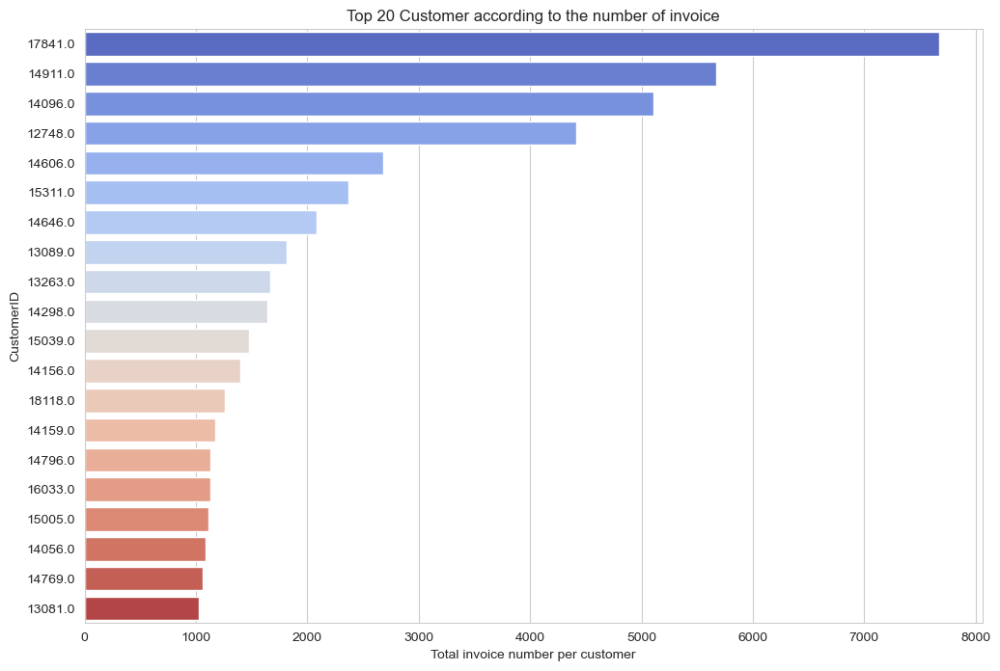

In [27]:
#plot top 20 Customer according to the number of invoice
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('Top 20 Customer according to the number of invoice')
sns.barplot(y='CustomerID',x='InvoiceNo',
            data=InvoiceNobyCustomer, palette='coolwarm', orient='h', order=InvoiceNobyCustomer['CustomerID']).set(xlabel='Total invoice number per customer')



***Explore the Transactions***

In [28]:
#number of quantities per transaction
QuantitiesperOrder = pd.DataFrame(df.groupby(['InvoiceNo'])['Quantity'].sum()).reset_index().sort_values('Quantity',ascending=False)[0:20]
QuantitiesperOrder.head(10)

,InvoiceNo,Quantity
8111,556917,15049
10611,563076,14730
14370,572035,13392
12418,567423,12572
6436,552883,12266
10842,563614,12196
10343,562439,11848
4540,548011,11116
3493,545475,10272
7883,556267,9811


[Text(0.5, 0, 'The number of quantities per transaction')]

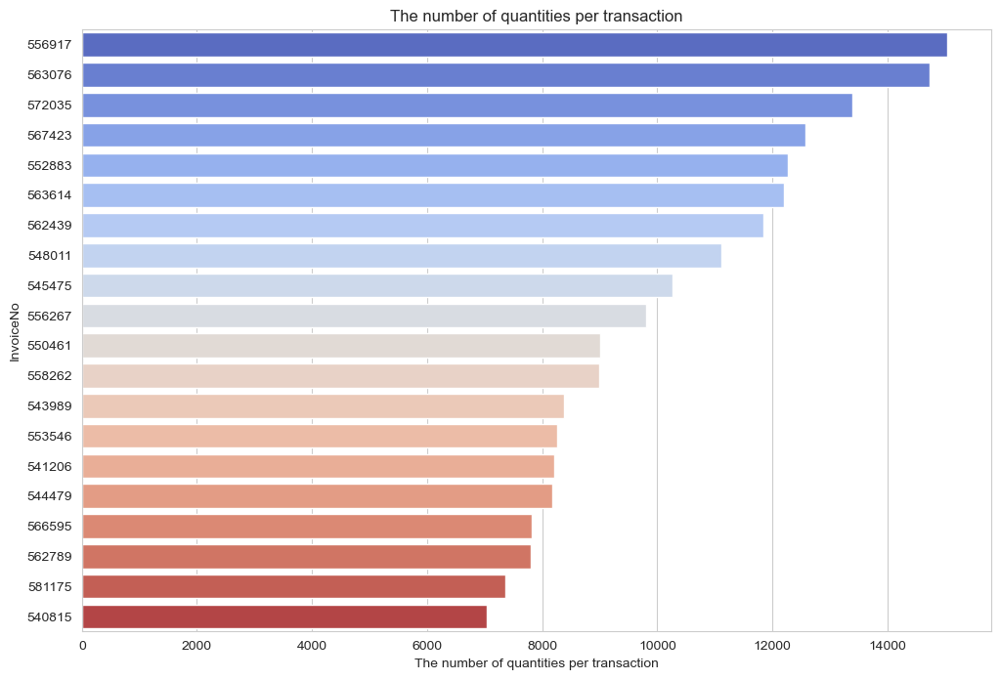

In [29]:
#plot the number of quantities per transaction
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The number of quantities per transaction')
sns.barplot(y='InvoiceNo',x='Quantity',
           data=QuantitiesperOrder, palette='coolwarm', orient='h', order=QuantitiesperOrder['InvoiceNo']).set(xlabel='The number of quantities per transaction')


In [30]:
#the number of items per purchase (InvoiceNo)
kindofitemsforOrder = pd.DataFrame(df.groupby(['InvoiceNo'])['StockCode'].count()).reset_index().sort_values('StockCode',ascending=False)[0:20]
kindofitemsforOrder.head(10)

,InvoiceNo,StockCode
16241,576339,542
17522,579196,533
18163,580727,529
17127,578270,442
15080,573576,435
12513,567656,421
12325,567183,392
15895,575607,377
14159,571441,364
13763,570488,353


[Text(0.5, 0, 'The number of items')]

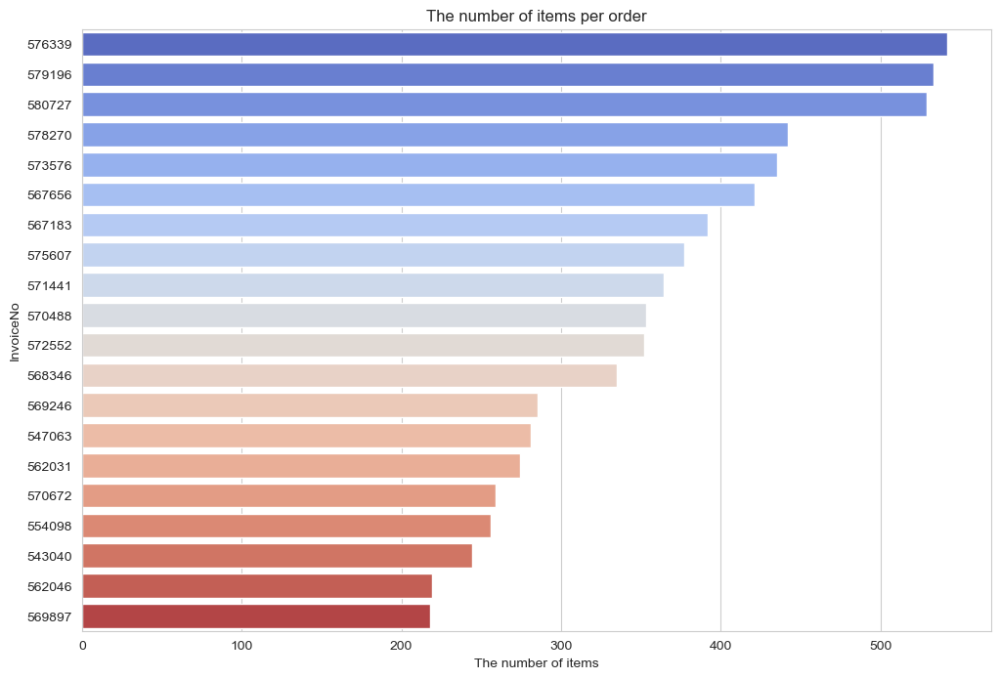

In [31]:
#the number of items per purchase
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The number of items per order')
sns.barplot(y='InvoiceNo',x='StockCode',
            data=kindofitemsforOrder, palette='coolwarm', orient='h', order=kindofitemsforOrder['InvoiceNo']).set(xlabel='The number of items')


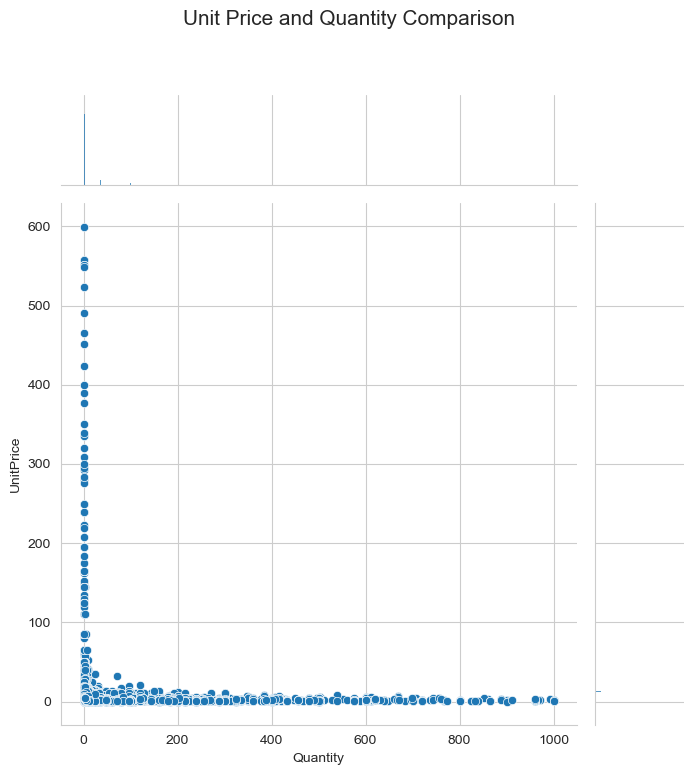

In [32]:
#plotting the quantity vs unitprice
Corr = sns.jointplot(x="Quantity", y="UnitPrice", data = df[(df['UnitPrice']  >0) & (df['Quantity']<= 1000) & (df['UnitPrice'] < 600 )], height = 7)
Corr.fig.suptitle("Unit Price and Quantity Comparison", fontsize = 15, y = 1.1)
plt.show()

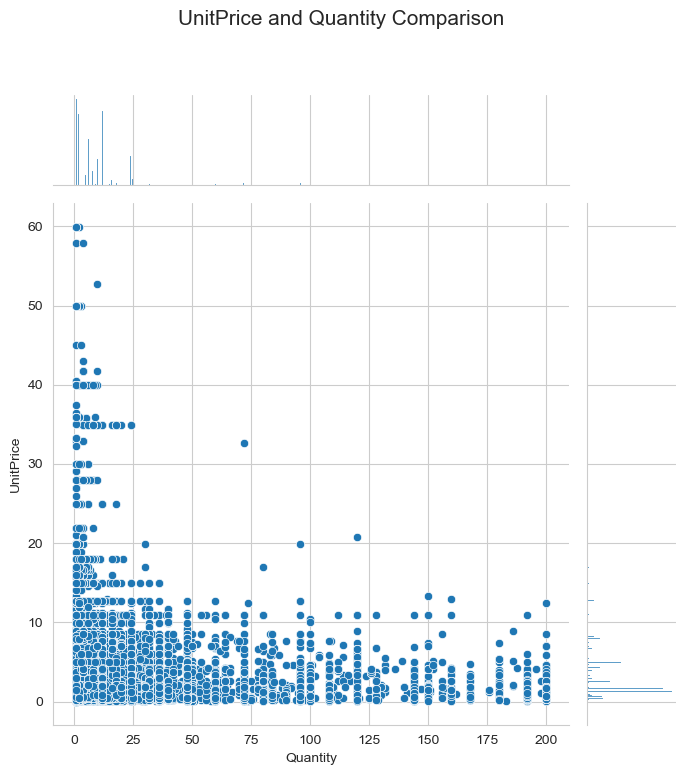

In [33]:
#plotting the quantity vs unit price to look closer 
Corr = sns.jointplot(x="Quantity", y="UnitPrice", data = df[(df['UnitPrice']  >0) & (df['Quantity']<= 200) & (df['UnitPrice'] < 60 )], height = 7)
Corr.fig.suptitle("UnitPrice and Quantity Comparison", fontsize = 15, y = 1.1)
plt.show()

***Explore the Descriptions***

In [34]:
#total number per description
totalnumberofDescription = pd.DataFrame(df.groupby(['Description'])['Quantity'].sum()).reset_index().sort_values('Quantity',ascending=False)[0:20]
totalnumberofDescription.head(10)

,Description,Quantity
3785,WORLD WAR 2 GLIDERS ASSTD DESIGNS,54319
1762,JUMBO BAG RED RETROSPOT,46078
3697,WHITE HANGING HEART T-LIGHT HOLDER,36706
216,ASSORTED COLOUR BIRD ORNAMENT,35263
2269,PACK OF 72 RETROSPOT CAKE CASES,33670
2599,POPCORN HOLDER,30919
2655,RABBIT NIGHT LIGHT,27153
2047,MINI PAINT SET VINTAGE,26076
2235,PACK OF 12 LONDON TISSUES,25329
2267,PACK OF 60 PINK PAISLEY CAKE CASES,24230


[Text(0.5, 0, 'Total number per description')]

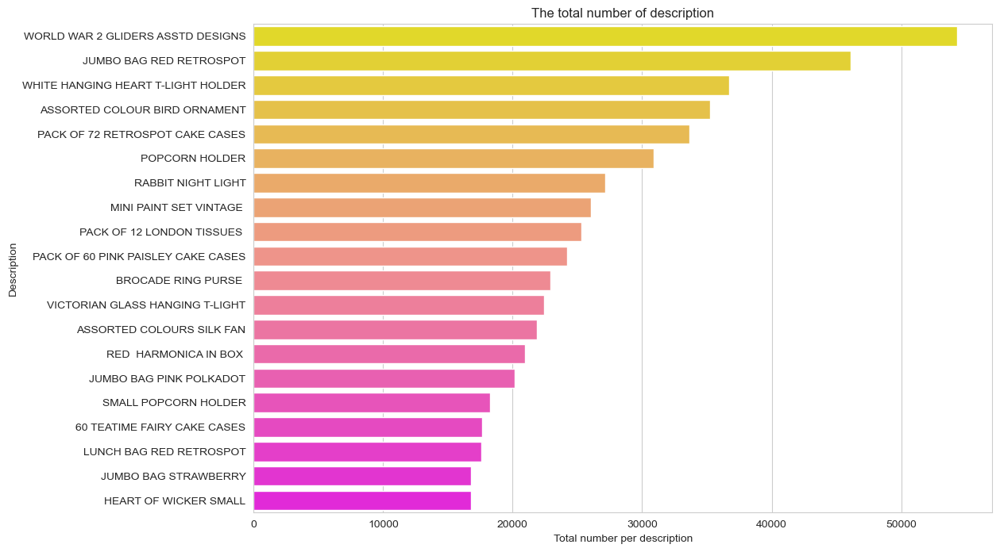

In [35]:
#plot total number per description
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total number of description')
sns.barplot(y='Description',x='Quantity',
           data=totalnumberofDescription, palette='spring_r', orient='h', order=totalnumberofDescription['Description']).set(xlabel='Total number per description')


In [36]:
#total amount of revenue per description
totalamountperDescription = pd.DataFrame(df.groupby(['Description'])['Revenue'].sum()).reset_index().sort_values('Revenue',ascending=False)[0:20]
totalamountperDescription.head(10)

,Description,Revenue
2766,REGENCY CAKESTAND 3 TIER,142264.75
3697,WHITE HANGING HEART T-LIGHT HOLDER,100392.10
1762,JUMBO BAG RED RETROSPOT,85040.54
2610,POSTAGE,77803.96
2344,PARTY BUNTING,68785.23
216,ASSORTED COLOUR BIRD ORNAMENT,56413.03
2130,Manual,53419.93
2655,RABBIT NIGHT LIGHT,51251.24
722,CHILLI LIGHTS,46265.11
2313,PAPER CHAIN KIT 50'S CHRISTMAS,42584.13


[Text(0.5, 0, 'Total amount of revenue per description')]

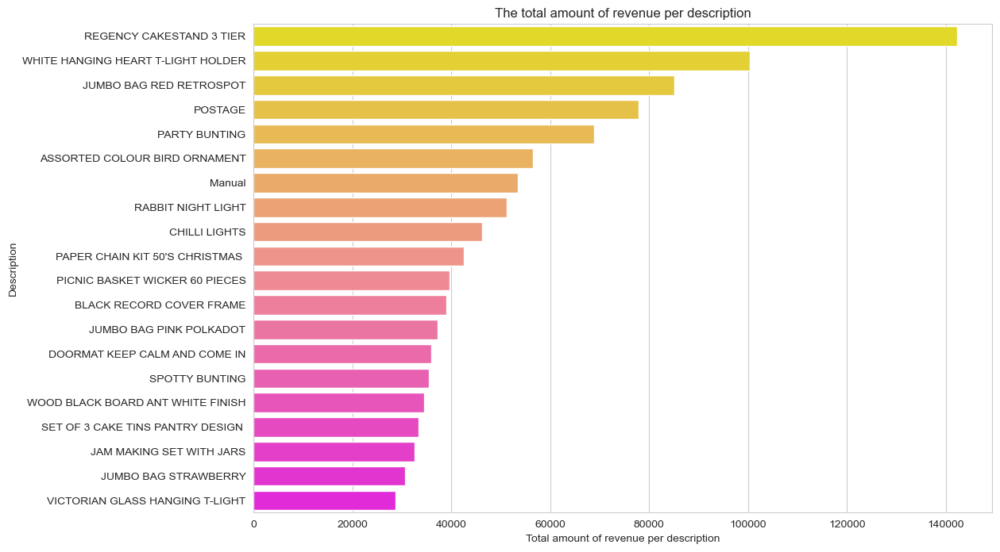

In [37]:
#plot total amount of revenue per description
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total amount of revenue per description')
sns.barplot(y='Description',x='Revenue',
           data=totalamountperDescription, palette='spring_r', orient='h', order=totalamountperDescription['Description']).set(xlabel='Total amount of revenue per description')


***Explore by Time***

In [38]:
#total amount of revenue per month
totalamountperMonth = pd.DataFrame(df.groupby(['month'])['Revenue'].sum()).reset_index().sort_values('Revenue',ascending=False)[0:20]
totalamountperMonth.head(10)

,month,Revenue
9,November,1156205.610
10,October,1035642.450
11,September,950690.202
2,December,919143.570
8,May,677355.150
6,June,660046.050
1,August,644051.040
5,July,598962.901
7,March,594081.760
4,January,490917.710


[Text(0.5, 0, 'Total amount of revenue per month')]

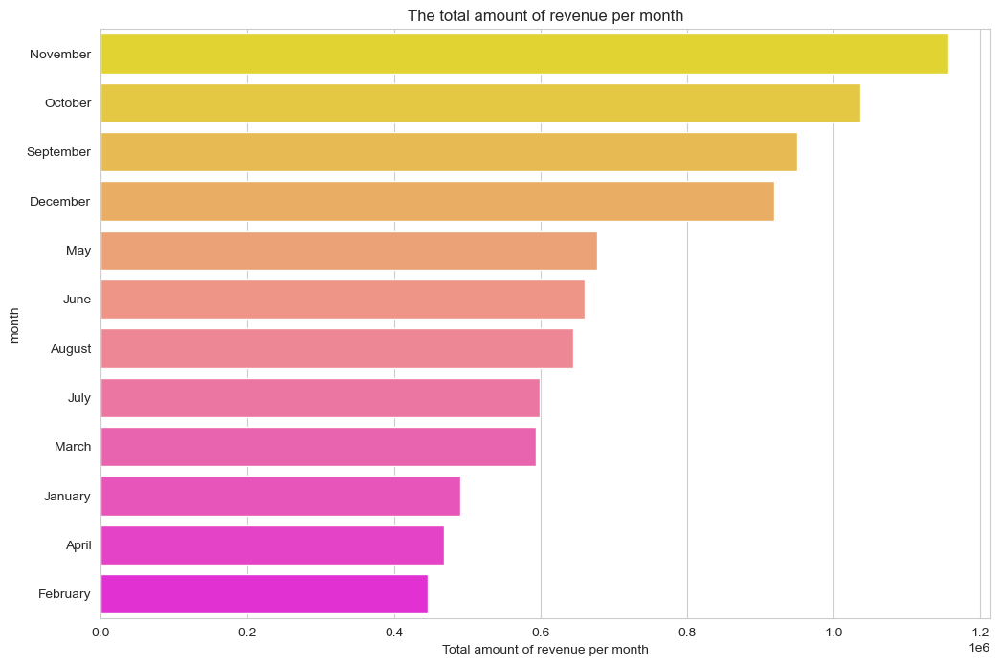

In [39]:
#plot total amount of revenue per month
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total amount of revenue per month')
sns.barplot(y='month',x='Revenue',
           data=totalamountperMonth, palette='spring_r', orient='h', order=totalamountperMonth['month']).set(xlabel='Total amount of revenue per month')


***The important point is that all transactions that took place between 01/12/2010 (dd/mm/yy) and 09/12/2011. November is in the top rank in terms of total revenue, followed by October.***  

In [40]:
#total number of quantity per time segment
totalQuantityperTimeSegment = pd.DataFrame(df.groupby(['TimeSegment'])['Quantity'].sum()).reset_index().sort_values('Quantity',ascending=False)[0:20]
totalQuantityperTimeSegment.head(10)

,TimeSegment,Quantity
0,Afternoon,2980610
2,Morning,1920613
1,Evening,96913


[Text(0.5, 0, 'Total number of quantity per time segment')]

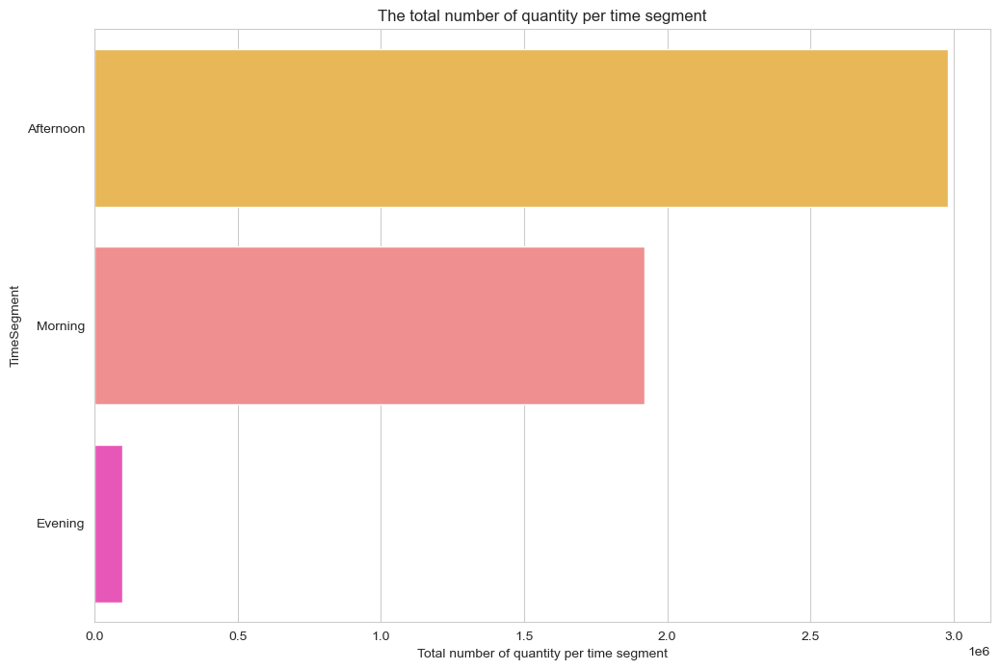

In [41]:
#plot total number of quantity per time segment
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total number of quantity per time segment')
sns.barplot(y='TimeSegment',x='Quantity',
           data=totalQuantityperTimeSegment, palette='spring_r', orient='h', order=totalQuantityperTimeSegment['TimeSegment']).set(xlabel='Total number of quantity per time segment')


In [42]:
#total number of quantity per day
totalQuantityperDay = pd.DataFrame(df.groupby(['day'])['Quantity'].sum()).reset_index().sort_values('Quantity',ascending=False)[0:20]
totalQuantityperDay.head(10)

,day,Quantity
3,Thursday,1150224
5,Wednesday,960128
4,Tuesday,931557
1,Monday,766919
0,Friday,728324
2,Sunday,460984


[Text(0.5, 0, 'Total number of quantity per day')]

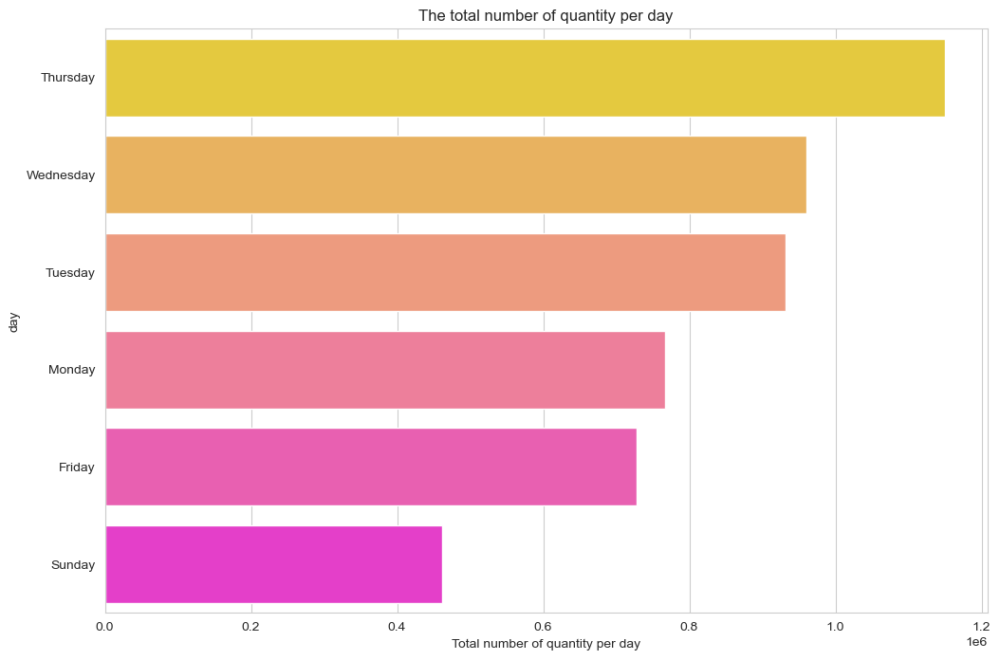

In [43]:
#plot total number of quantity per day
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total number of quantity per day')
sns.barplot(y='day',x='Quantity',
           data=totalQuantityperDay, palette='spring_r', orient='h', order=totalQuantityperDay['day']).set(xlabel='Total number of quantity per day')


***Explore by Country***

In [44]:
#total number of quantity per country
totalQuantityperCountry = pd.DataFrame(df.groupby(['Country'])['Quantity'].sum()).reset_index().sort_values('Quantity',ascending=False)[0:20]
totalQuantityperCountry.head(10)

,Country,Quantity
35,United Kingdom,4086287
23,Netherlands,200937
10,EIRE,140383
14,Germany,119156
13,France,111429
0,Australia,84199
31,Sweden,36078
32,Switzerland,30083
30,Spain,27944
19,Japan,26016


[Text(0.5, 0, 'Total number of quantity per country')]

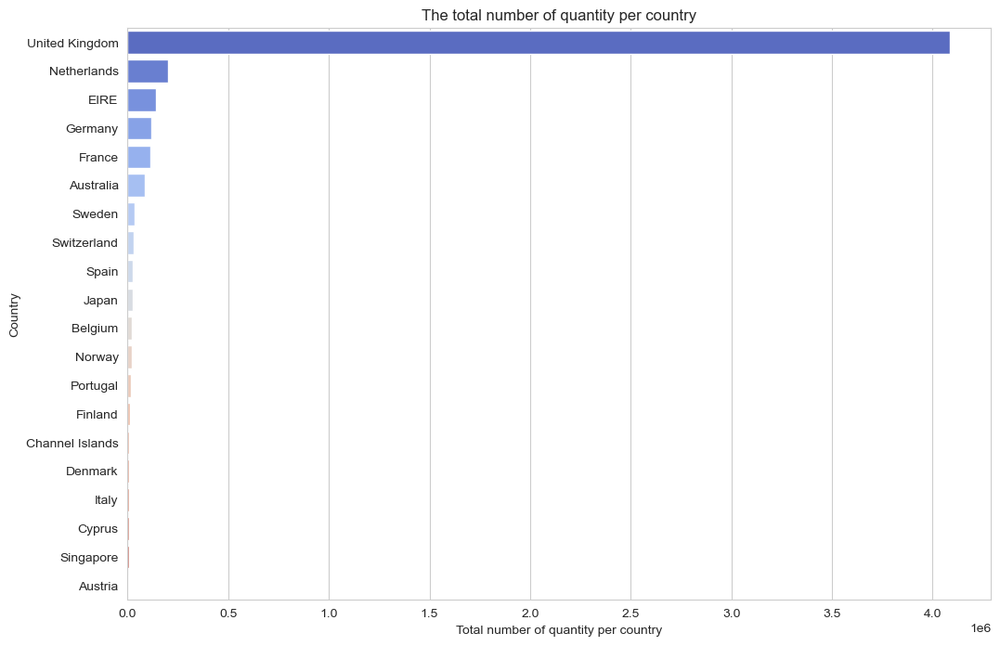

In [45]:
#plot total number of quantity per country
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('The total number of quantity per country')
sns.barplot(y='Country',x='Quantity',
           data=totalQuantityperCountry, palette='coolwarm', orient='h', order=totalQuantityperCountry['Country']).set(xlabel='Total number of quantity per country')


***Explore Cancel Orders***

In [46]:
#the unique number of InvoiceNo per customer
CancelInvoiceNobyCustomer = pd.DataFrame(dfCancelOrders.groupby(['CustomerID','Country'])['InvoiceNo'].count()).reset_index().sort_values('InvoiceNo',ascending=False)[0:20]
CancelInvoiceNobyCustomer.head(10)

,CustomerID,Country,InvoiceNo
737,14911.0,EIRE,226
1486,17841.0,United Kingdom,136
1398,17511.0,United Kingdom,113
849,15311.0,United Kingdom,112
90,12607.0,USA,101
606,14410.0,United Kingdom,92
418,13798.0,United Kingdom,89
653,14606.0,United Kingdom,82
247,13113.0,United Kingdom,79
37,12471.0,Germany,71


[Text(0.5, 0, 'Total canceled invoice number per customer')]

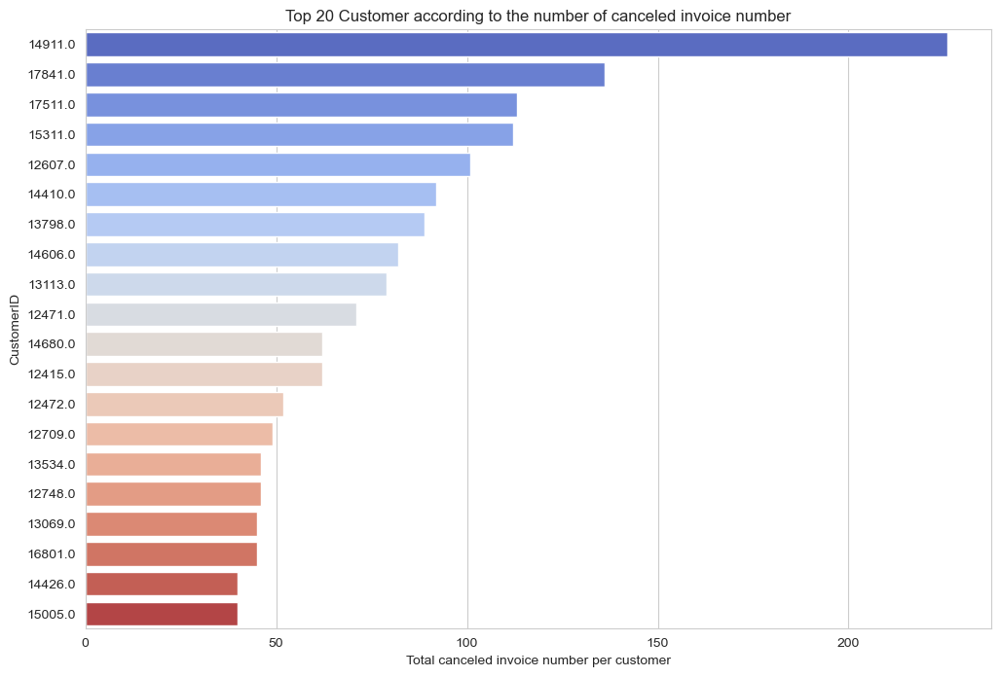

In [47]:
#plot top 20 Customer according to the number of canceled invoice number
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('Top 20 Customer according to the number of canceled invoice number')
sns.barplot(y='CustomerID',x='InvoiceNo',
            data=CancelInvoiceNobyCustomer, palette='coolwarm', orient='h', order=CancelInvoiceNobyCustomer['CustomerID']).set(xlabel='Total canceled invoice number per customer')



In [48]:
#the total amount of revenue per customer
CancelRevenuebyCustomer = pd.DataFrame(dfCancelOrders.groupby(['CustomerID','Country'])['Revenue'].sum()).reset_index().sort_values('Revenue',ascending=True)[0:20]
CancelRevenuebyCustomer.head(10)

,CustomerID,Country,Revenue
1137,16446.0,United Kingdom,-168469.60
0,12346.0,United Kingdom,-77183.60
780,15098.0,United Kingdom,-39267.00
1040,16029.0,United Kingdom,-27682.15
966,15749.0,United Kingdom,-22998.40
137,12744.0,Singapore,-12158.90
737,14911.0,EIRE,-11252.44
186,12931.0,United Kingdom,-8593.15
61,12536.0,France,-8495.01
498,14096.0,United Kingdom,-8043.88


[Text(0.5, 0, 'The total amount of revenue per customer')]

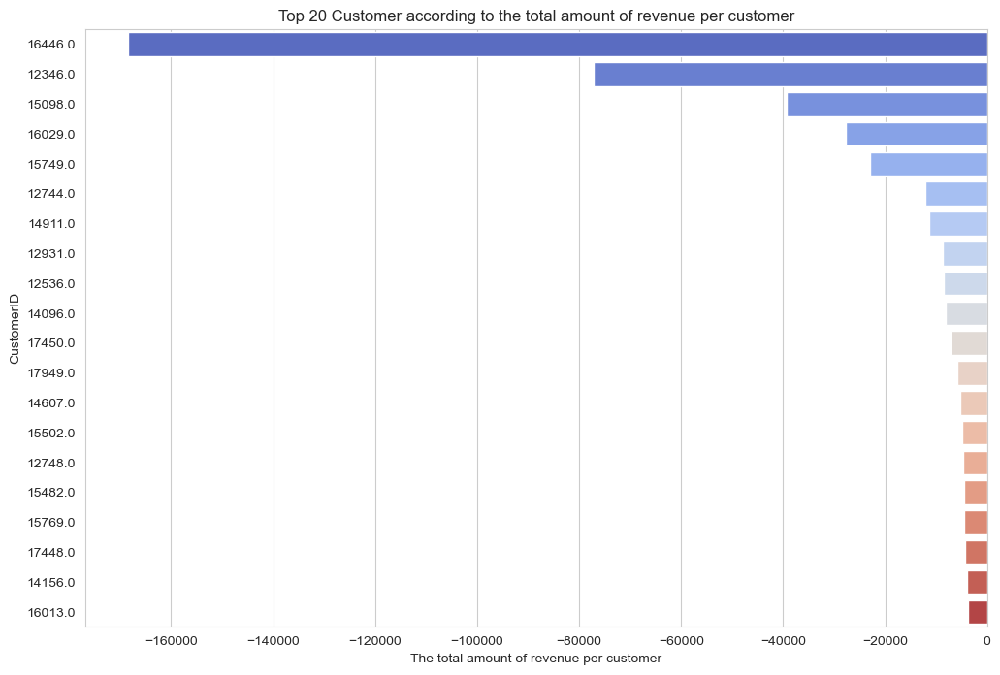

In [49]:
#plot top 20 Customer according to the total amount of revenue per customer
sns.set_style('whitegrid')
plt.figure(figsize=(12,8))
plt.title('Top 20 Customer according to the total amount of revenue per customer')
sns.barplot(y='CustomerID',x='Revenue',
            data=CancelRevenuebyCustomer, palette='coolwarm', orient='h', order=CancelRevenuebyCustomer['CustomerID']).set(xlabel='The total amount of revenue per customer')



## RFM Analysis ##
The [RFM](https://www.putler.com/rfm-analysis/) model is a marketing analysis framework used to segment and understand customer behavior based on three key factors: Recency, Frequency, and Monetary Value. It is commonly employed by businesses to categorize their customer base into distinct groups, which can then be used for targeted marketing strategies and personalized communication. </br>
</br>
**Recency** – ***How recently did the customer purchase?***</br>
**Frequency** – ***How often do they purchase?***</br>
**Monetary** – ***How much do they spend?***</br></br>
***Recency*** - In order to find the recency value of each customer, we need to determine the last invoice date as the current date and subtract the last purchasing date of each customer from this date.</br>

***Frequency*** - In order to find the frequency value of each customer, we need to determine how many times the customers make purchases.</br>

***Monetary*** - In order to find the monetary value of each customer, we need to determine how much do the customers spend on purchases.</br>
By analyzing these three dimensions, businesses can segment their customer base into various groups. Here's a general breakdown of how this segmentation might occur: </br>

***High-Value Customers:*** These are customers who have recently made frequent purchases of high monetary value. They are often the most valuable segment as they contribute significantly to the business's revenue.

***Recent Customers:*** These are customers who have made purchases or engaged with the business recently. While they might not have a long history with the brand, their recent activity suggests potential interest.

***Loyal Customers:*** This group comprises customers who make frequent purchases, regardless of the monetary value. They may not spend as much as high-value customers individually, but their consistent engagement is valuable.

***Churned Customers:*** These are customers who were active in the past but haven't interacted with the business recently. Identifying and re-engaging with these customers can help reduce churn.

***Low-Value Customers:*** These customers might have made a few low-value purchases, but their overall impact on the business's revenue is relatively small.

***Inactive Customers:*** This group includes customers who haven't engaged with the business for a significant period. These customers might require special re-engagement efforts to bring them back.</br>

Benefits of RFM Analysis

- Increased customer retention/ decrease churn
- Increased response rate
- Increased conversion rate
- Increased revenue

The RFM model can provide businesses with insights into customer behavior, allowing them to tailor marketing campaigns, offers, and communication strategies to each segment's unique characteristics. It's important to note that while the RFM model is a useful tool, its effectiveness can be enhanced when combined with additional data and more advanced analytics techniques

In [54]:
import datetime as dt
print(df['InvoiceDate'].min())
print(df['InvoiceDate'].max())

2010-12-01 08:26:00
2011-12-09 12:50:00


In [55]:
presence=dt.datetime(2011,12,10)

#Create RFM scores for each customer
#Recency = Presence - Last Invoice Data
#Frequency = Total Number of Transactions
#Monetary = Total money spent
df_rfm=df.groupby('CustomerID').agg({'InvoiceDate': lambda x: (presence-x.max()).days,
                                    'InvoiceNo': lambda x: len(x),
                                    'Revenue': lambda x: x.sum()})

#Convert Invoice Date into type int
df_rfm['InvoiceDate']= df_rfm['InvoiceDate'].astype(int)

#Rename column names to Recency, Frequency and Monetary
df_rfm.rename(columns={'InvoiceDate': 'Recency',
                      'InvoiceNo':'Frequency',
                      'Revenue': 'Monetary'}, inplace=True)

df_rfm.head(10)

,Recency,Frequency,Monetary
CustomerID,,,
12347.0,2,182,4310.00
12348.0,75,31,1797.24
12349.0,18,73,1757.55
12350.0,310,17,334.40
12352.0,36,85,2506.04
12353.0,204,4,89.00
12354.0,232,58,1079.40
12355.0,214,13,459.40
12356.0,22,59,2811.43


In [56]:
#descriptive statistics of all variables
df_rfm.describe(include='all')

,Recency,Frequency,Monetary
count,4337.000000,4337.000000,4337.000000
mean,92.053032,90.553147,1992.519182
std,99.966159,225.559226,8547.583474
min,0.000000,1.000000,2.900000
25%,17.000000,17.000000,306.450000
50%,50.000000,41.000000,668.430000
75%,142.000000,98.000000,1657.280000
max,373.000000,7676.000000,280206.020000


(0.0, 600.0)

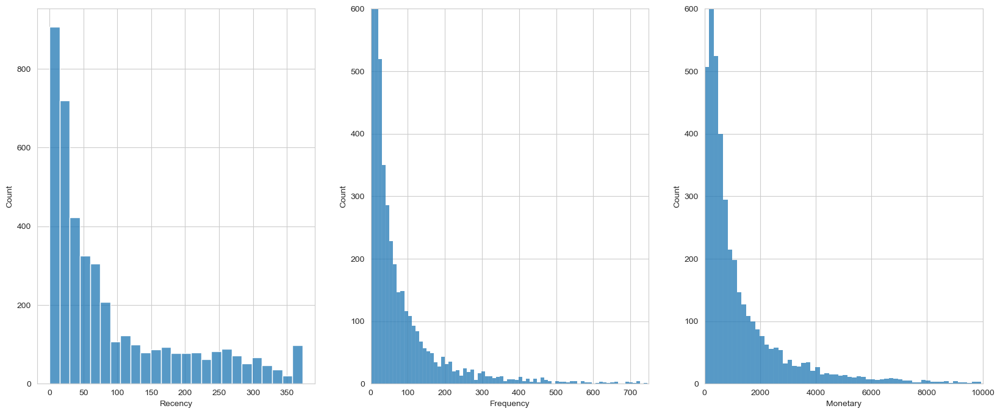

In [57]:
#plot the data distribution 
fig, axis = plt.subplots(nrows=1, ncols=3, figsize=(20,8))
sns.histplot(df_rfm['Recency'], ax=axis[0])
sns.histplot(df_rfm['Frequency'], ax=axis[1])
axis[1].set_xlim(0, 750)
axis[1].set_ylim(0,600)
sns.histplot(df_rfm['Monetary'], ax=axis[2])
axis[2].set_xlim(0, 10000)
axis[2].set_ylim(0,600)

## Customer Segmentation with RFM Scores

Businesses have an enduring desire to comprehend their customers deeply. Enhanced customer understanding leads to improved service delivery, subsequently resulting in heightened financial returns from each customer. This strategic pursuit of comprehending customers, termed as [Customer Segmentation](https://clevertap.com/blog/rfm-analysis/), has been a practice since the inception of trade. Customer Segmentation involves categorizing customers based on their specific requirements. Common techniques for such categorization include evaluating their Recency-Frequency-Monetary (RFM) values, analyzing demographic factors like gender, geographic location, and employing business-derived scoring systems. For the current case, we will utilize the RFM values.

In the subsequent section, an RFM Segmentation Table will be constructed to categorize customers according to the RFM table. For instance, designations like "Big Spenders" will be assigned to the highest value customers, while those who have disengaged might be labeled as "Lost Customers".

## Calculate RFM Scoring

The simplest way to create customer segments from an RFM model is by using **Quartiles**. We will assign a score from 1 to 4 to each category (Recency, Frequency, and Monetary) with 4 being the highest/best value. The final RFM score is calculated by combining all RFM values. For Customer Segmentation, you will use the df_rfm data set resulting from the RFM analysis.

|**Segment**| **RFM** |**Description**|**Marketing** |
|:--------:|:--------:|:--------:|:--------:|
|Best Customers|444|Bought most recently and most often, and spend the most|No price incentives, new products, and loyalty programs|
|Loyal Customers|X4X|Buy most frequently|Use R and M to further segment|
|Big Spenders|XX4|Spend the most|Market your most expensive products|
|Almost Lost|244|Haven’t purchased for some time, but purchased frequently and spend the most|Aggressive price incentives|
|Lost Customers|144|Haven’t purchased for some time, but purchased frequently and spend the most|Aggressive price incentives|
|Lost Cheap Customers|111|Last purchased long ago, purchased few, and spent little|Don’t spend too much trying to re-acquire|</br>
</br>
[Source](http://www.blastam.com/blog/rfm-analysis-boosts-sales)</br>
Note: The author in the article scores 1 as the highest and 4 as the lowest.

In [58]:
#Calculating R_score, F_score and M_score by splitting them by quantiles 
df_rfm['R_score']=pd.qcut(df_rfm['Recency'], q=4, labels=[4,3,2,1]).astype(int)
df_rfm['F_score']=pd.qcut(df_rfm['Frequency'], q=4, labels=[4,3,2,1]).astype(int)
df_rfm['M_score']=pd.qcut(df_rfm['Monetary'], q=4, labels=[4,3,2,1]).astype(int)

#Calculating RFM score for each customer
df_rfm['RFM_Score']=df_rfm['R_score']+df_rfm['F_score']+df_rfm['M_score']

# Finding the rfm group for each customer 
df_rfm['RFM'] = 100*df_rfm['R_score'] + 10*df_rfm['F_score'] + df_rfm['M_score']

df_rfm.head()

,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM_Score,RFM
CustomerID,,,,,,,,
12347.0,2,182,4310.00,4,1,1,6,411
12348.0,75,31,1797.24,2,3,1,6,231
12349.0,18,73,1757.55,3,2,1,6,321
12350.0,310,17,334.40,1,4,3,8,143
12352.0,36,85,2506.04,3,2,1,6,321


In [59]:
#Handling negative and zero values
def handle_neg_n_zero(num):
    if num <= 0:
        return 1
    else:
        return num
    
#Applying handle_neg_n_zero function to Recency and Monetary columns 
df_rfm['Recency'] = [handle_neg_n_zero(x) for x in df_rfm.Recency]
df_rfm['Monetary'] = [handle_neg_n_zero(x) for x in df_rfm.Monetary]

#Performing Log transformation on columns for smoothening the distribution
Log_Tfd_Data = df_rfm[['Recency', 'Frequency', 'Monetary']].apply(np.log, axis = 1).round(3)
Log_Tfd_Data.head()

,Recency,Frequency,Monetary
CustomerID,,,
12347.0,0.693,5.204,8.369
12348.0,4.317,3.434,7.494
12349.0,2.890,4.290,7.472
12350.0,5.737,2.833,5.812
12352.0,3.584,4.443,7.826


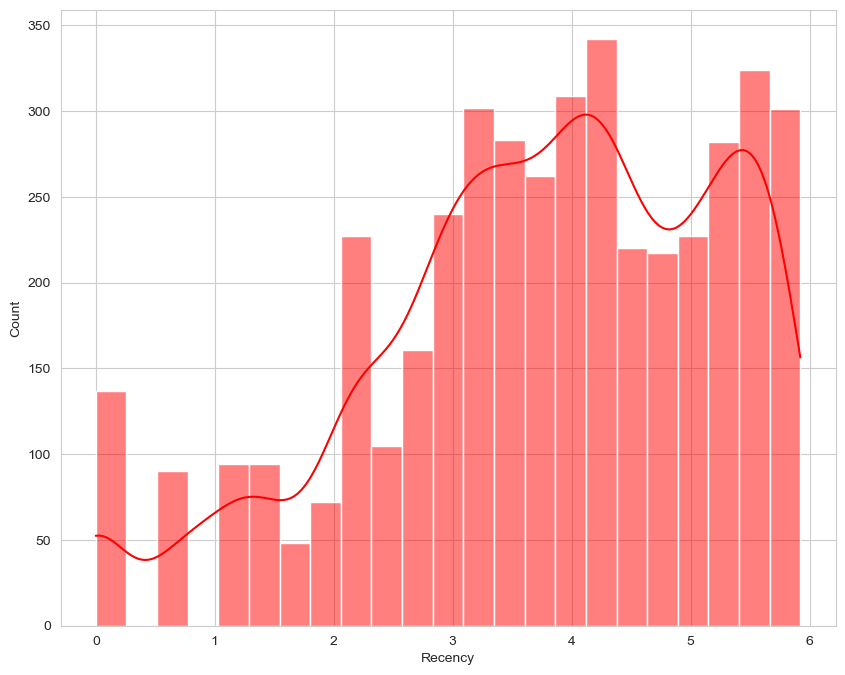

In [60]:
# Data distribution after data normalization for Recency
Plot_R = Log_Tfd_Data['Recency']
plt.figure(figsize=(10, 8))
sns.histplot(data=Plot_R, color='r', kde=True) 
plt.show()

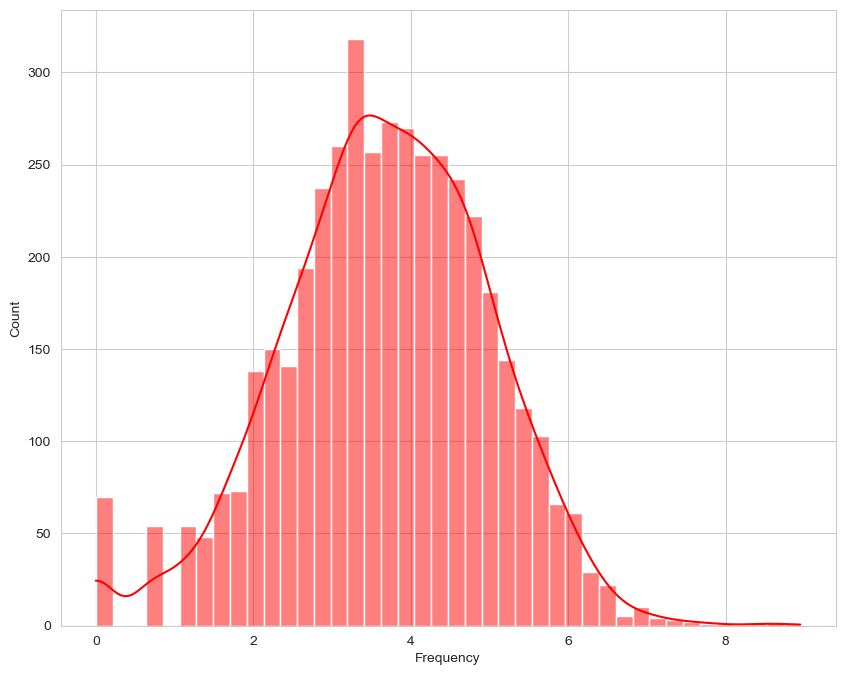

In [61]:
# Data distribution after data normalization for Frequency
Plot_F = Log_Tfd_Data['Frequency']
plt.figure(figsize=(10, 8))
sns.histplot(data=Plot_F, color='r', kde=True) 
plt.show()

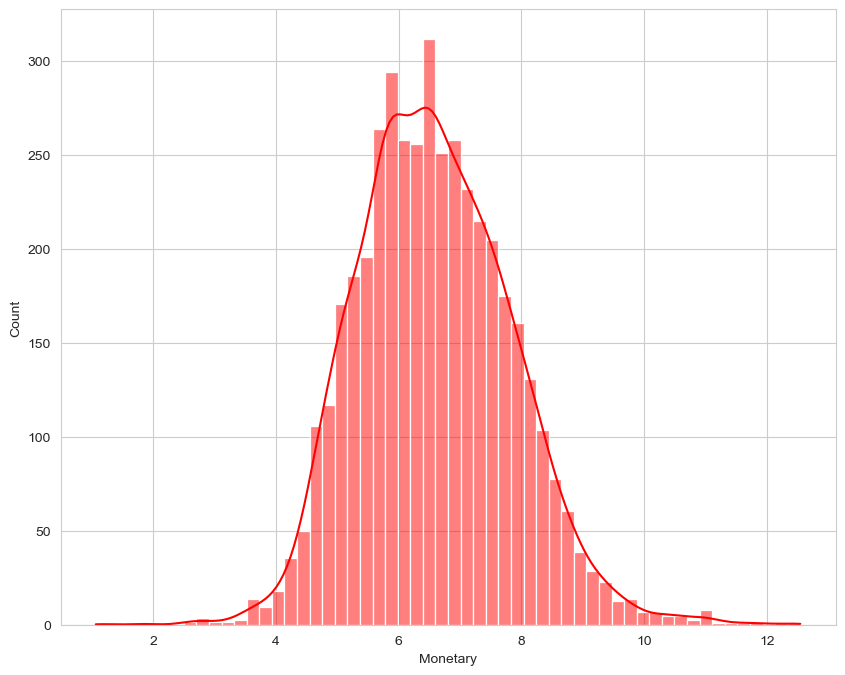

In [62]:
# Data distribution after data normalization for Monetary
Plot_M = Log_Tfd_Data['Monetary']
plt.figure(figsize=(10, 8))
sns.histplot(data=Plot_M, color='r', kde=True) 
plt.show()

In [63]:
df_rfm['Log_R']=Log_Tfd_Data['Recency']
df_rfm['Log_F']=Log_Tfd_Data['Frequency']
df_rfm['Log_M']=Log_Tfd_Data['Monetary']
df_rfm.head()

,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM_Score,RFM,Log_R,Log_F,Log_M
CustomerID,,,,,,,,,,,
12347.0,2,182,4310.00,4,1,1,6,411,0.693,5.204,8.369
12348.0,75,31,1797.24,2,3,1,6,231,4.317,3.434,7.494
12349.0,18,73,1757.55,3,2,1,6,321,2.890,4.290,7.472
12350.0,310,17,334.40,1,4,3,8,143,5.737,2.833,5.812
12352.0,36,85,2506.04,3,2,1,6,321,3.584,4.443,7.826


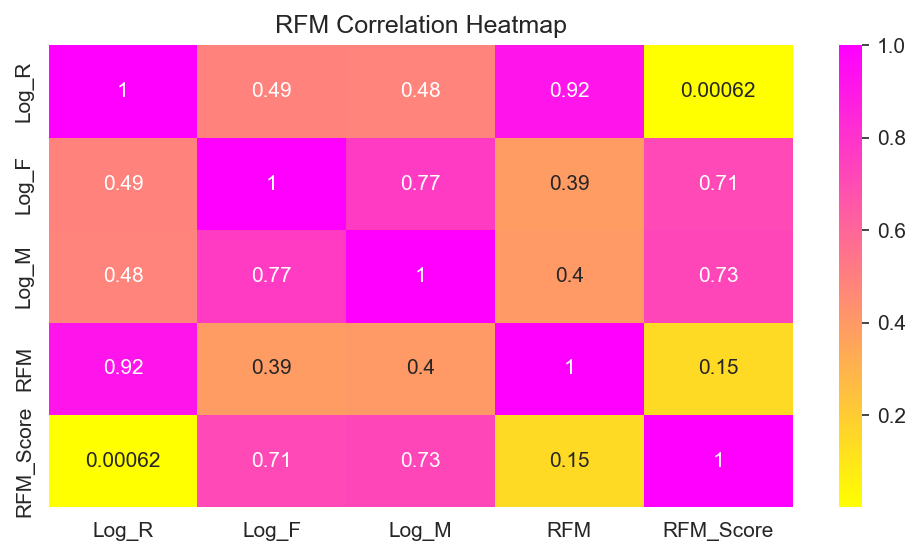

In [64]:
# Visualizing the correlations among features
column = ['Log_R','Log_F','Log_M','RFM','RFM_Score']

plt.figure(figsize=(8,4), dpi=150)
sns.heatmap(abs(df_rfm[column].corr()), annot=True, cmap='spring_r')
plt.title('RFM Correlation Heatmap')
plt.show()

Text(0.5, 0.92, 'Data Visualization')

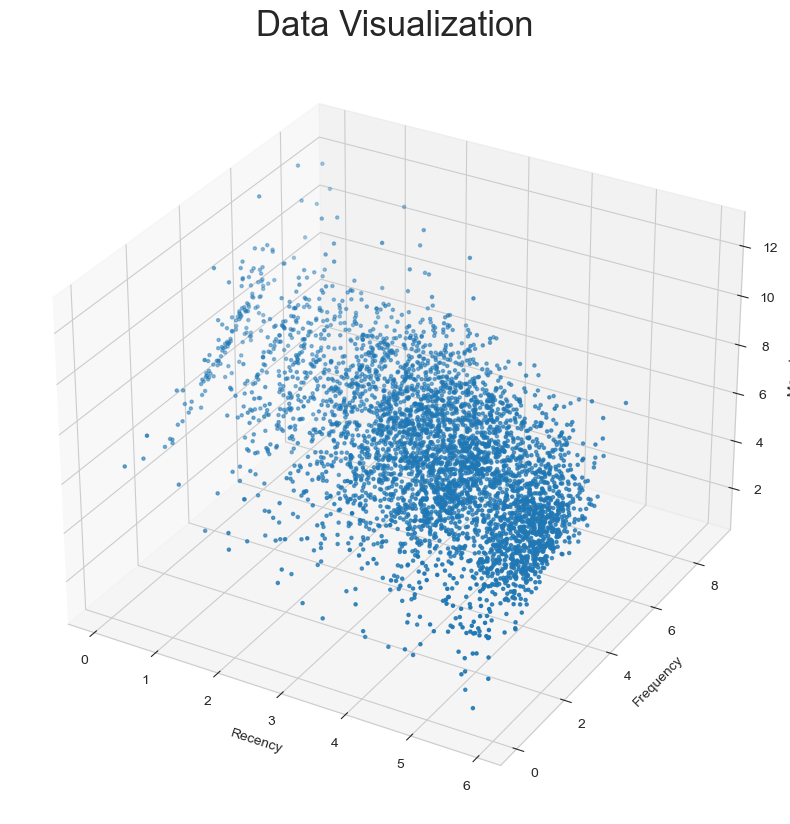

In [65]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# plot data points in 3D space
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
x = df_rfm['Log_R']
y = df_rfm['Log_F']
z = df_rfm['Log_M']
ax.scatter(x, y, z, marker='.')
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
plt.title("Data Visualization", size=25)

## K-Means Clustering

Clustering is an unsupervised machine learning technique used to uncover underlying groups within data. One common approach for this is the [K-means clustering](https://scikitlearn.org/stable/modules/generated/sklearn.cluster.KMeans.html) algorithm, which is frequently employed to identify distinct segments within a customer dataset.</br>

Our dataset is large so Hierarchical clustering is not well suited for analysis.</br>

During the process of building a KMeans model, it's essential to specify the number of clusters beforehand. To determine the most appropriate number of clusters, various methods like silhouette analysis and the elbow method can be utilized. These techniques aid in selecting the optimal number of clusters that best represents the inherent structure of the data.

**[Elbow Method](https://www.statology.org/elbow-method-in-python/)**</br>
One of the most common ways to choose a value for K is known as the elbow method, which involves creating a plot with the number of clusters on the x-axis and the total within sum of squares on the y-axis and then identifying where an “elbow” or bend appears in the plot.</br>

The point on the x-axis where the “elbow” occurs tells us the optimal number of clusters to use in the k-means clustering algorithm.

In [66]:
#create a new dataset to cluster customers by recency, frequency and monetary
df_cluster=df_rfm[['Log_R','Log_F','Log_M']]
df_cluster = df_cluster.reset_index(drop=True)
df_cluster.head()

,Log_R,Log_F,Log_M
0,0.693,5.204,8.369
1,4.317,3.434,7.494
2,2.890,4.290,7.472
3,5.737,2.833,5.812
4,3.584,4.443,7.826


In [67]:
#df_clusterScaled=df_cluster

In [68]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

#Scaled df_cluster where each variable has mean of 0 and standard dev of 1
df_cluster = pd.DataFrame(df_cluster)
scaler = StandardScaler()
df_clusterScaled = scaler.fit_transform(df_cluster)

print(df_clusterScaled)

[[-2.06658152e+00  1.16054770e+00  1.41835454e+00]
 [ 3.93073233e-01 -1.80688607e-01  7.23820703e-01]
 [-5.75449762e-01  4.67954489e-01  7.06358138e-01]
 ...
 [-1.21615453e+00 -8.99803441e-01 -1.11133613e+00]
 [-1.79102417e+00  2.20398408e+00  8.26214834e-01]
 [ 9.85909588e-05  4.36128543e-01  7.41283268e-01]]


In [69]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# calculate Elbow method scores
# sum of squared errors
sse = {} 

# use cluster from range 1 to 20
for k in range(1, 21):
    # Initialize KMeans with k clusters
    kmeans = KMeans(n_clusters=k, random_state=1)
    # Fit KMeans on the dataset
    kmeans.fit(df_clusterScaled)
    # Assign sum of squared distances to k element of dictionary
    sse[k] = kmeans.inertia_ # Used for Plotting the elbow plot

/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/

<AxesSubplot: title={'center': 'The Elbow Method'}, xlabel='k', ylabel='Sum of squared errors'>

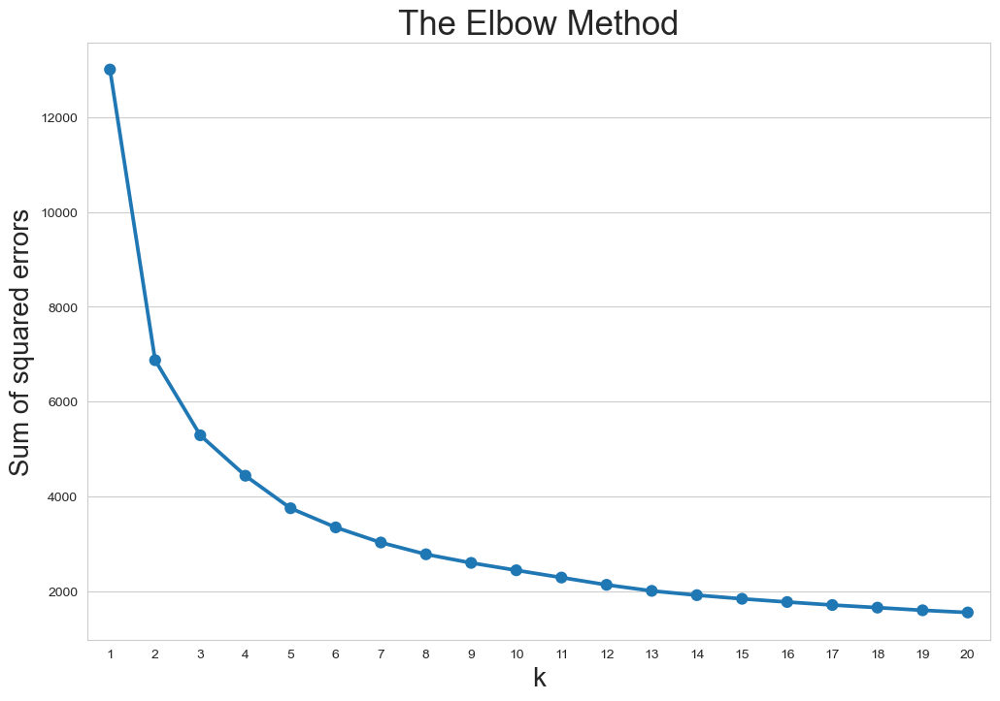

In [70]:
# the elbow plot
plt.figure(figsize=(12,8))
plt.title('The Elbow Method', size=25)
plt.xlabel('k', size=20); 
plt.ylabel('Sum of squared errors', size=20)
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))

As we analyze the graph depicting the sum of squared errors for various values of K, it's evident that the error tends to decrease with the increasing number of clusters. However, upon closer examination, when K reaches around 4 or 5, the rate of error reduction becomes notably steeper. This implies that by adding more clusters, the reduction in error becomes marginal compared to the increment in cluster count.</br>

Each cluster in this context corresponds to a distinct customer segment. Implementing tailored policies for each of these segments requires additional resources and planning. As the number of clusters rises, the organization incurs extra costs to devise and execute individualized strategies for each segment.</br>

Hence, while it's tempting to consider a higher number of clusters to capture finer details in customer behavior, this can lead to diminishing returns in terms of error reduction and increased operational complexity. Striking a balance is crucial, and in this case, opting for K=4 appears reasonable. This choice offers a good compromise between reducing errors through segmentation and managing the practicality of implementing policies for the distinct customer groups.

[Silhouette Coefficient](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)</br>
The overall silhouette score for a clustering can be computed by taking the average silhouette coefficient across all data points. This score provides insight into how well the data is clustered and whether the chosen number of clusters is appropriate. Higher silhouette scores indicate better-defined clusters.

In [71]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Calculate Silhouette score
# Initialize the list to store silhouette scores
score = []

# Initializing the list of clusters for tuning the best clusters
n_clusters = list(range(2, 20))

# Load your data or create your data frame df_clusterScaled

for k in n_clusters:
    kmeans = KMeans(n_clusters=k, random_state=0)  # Initialize KMeans model
    y_preds = kmeans.fit_predict(df_clusterScaled)  # Fit the model and get cluster assignments
    score.append(silhouette_score(df_clusterScaled, y_preds))  # Append the silhouette score to the list

# Now you have a list 'score' containing silhouette scores for different numbers of clusters


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/

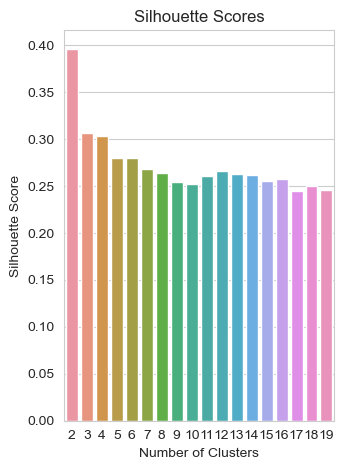

In [72]:
# Silhouette Score v/s Number of Clusters
plt.subplot(1, 2, 2)                                                            
sns.barplot(x=n_clusters, y=score)                                              
plt.xlabel('Number of Clusters')                                            
plt.ylabel('Silhouette Score')                                                  
plt.title('Silhouette Scores')                                                 
plt.tight_layout()

**Outcomes by Elbow method and Silhoutte score**</br>

Based on the results obtained, selecting the ***highest silhouette score*** suggests that there could be ***two*** distinct clusters. On the other hand, choosing the ***lowest elbow squared error*** indicates that there might be around ***ten*** clusters. </br>

As a result, in order to determine the most suitable number of clusters based on graphics, it is necessary to carefully consider the outcomes, and it appears that opting for a solution with ***four different cluster groups*** could be a ***balanced approach***.

**K=4 have optimal score. Let's visualize these clusters.**

In [73]:
clusterer = KMeans(n_clusters=4, random_state=1)
cluster_label = clusterer.fit_predict(df_clusterScaled)

/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [74]:
cluster_label

array([0, 1, 1, ..., 3, 0, 1], dtype=int32)

Text(0.5, 0.92, 'Data Visualization')

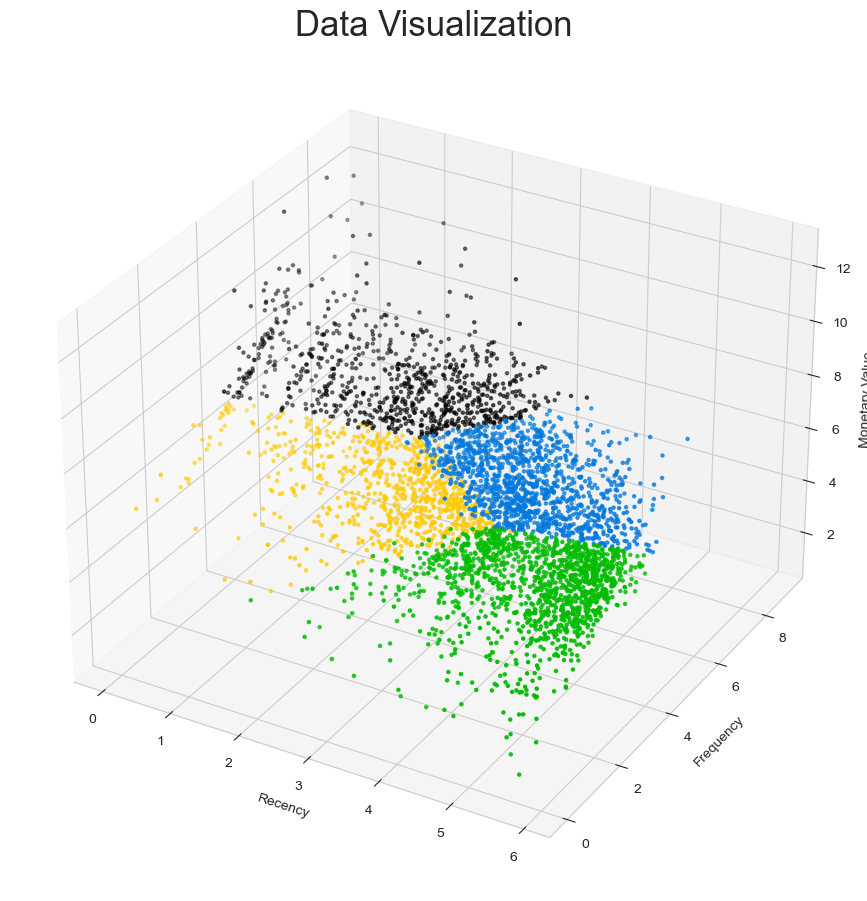

In [75]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
# plot data points in 3D space
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
x = df_cluster['Log_R']
y = df_cluster['Log_F']
z = df_cluster['Log_M']
colors = cm.nipy_spectral(cluster_label.astype(float) / 4)
ax.scatter(x, y, z, c=colors, marker='.')
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary Value')
plt.title("Data Visualization", size=25)


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.3961133647496796


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 3 The average silhouette_score is : 0.30400676642553737


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 4 The average silhouette_score is : 0.30316289190060947


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.2797007629285468


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 6 The average silhouette_score is : 0.27956889687891856


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 7 The average silhouette_score is : 0.2633029005431065


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 8 The average silhouette_score is : 0.2665353161429569


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 9 The average silhouette_score is : 0.25827775253105306


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 10 The average silhouette_score is : 0.26038301809249415


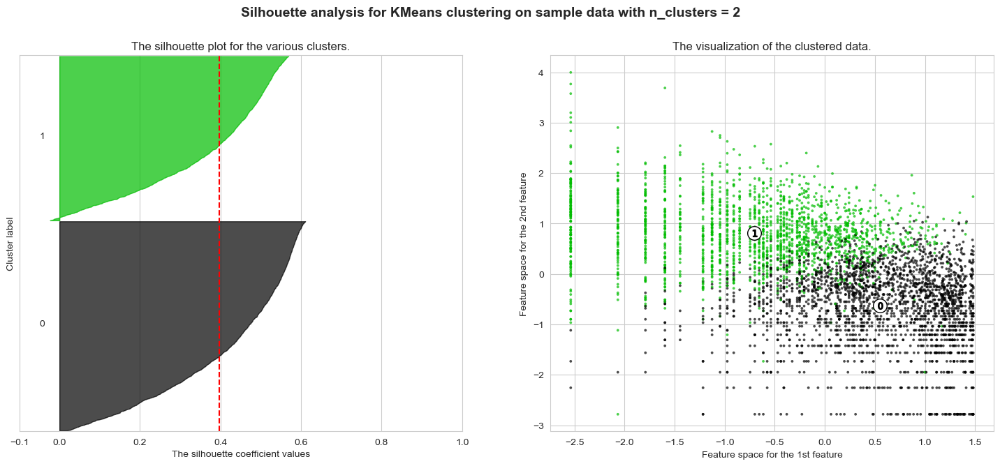

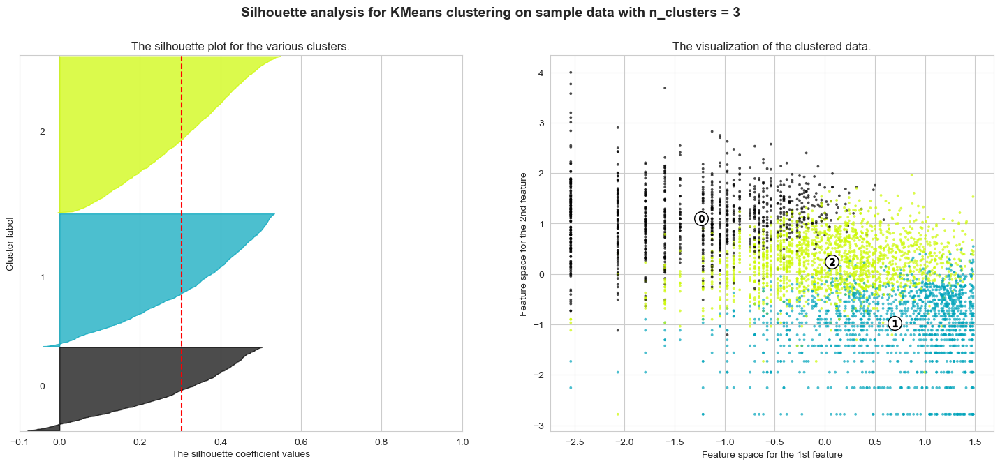

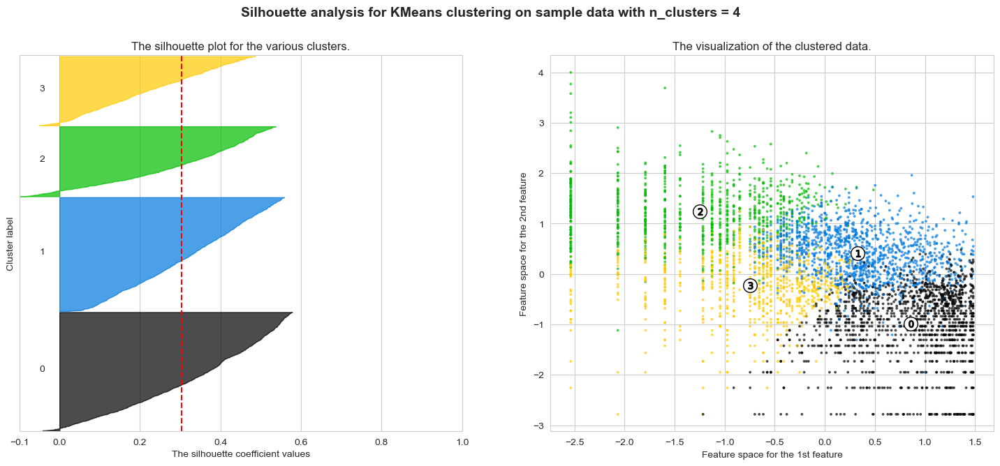

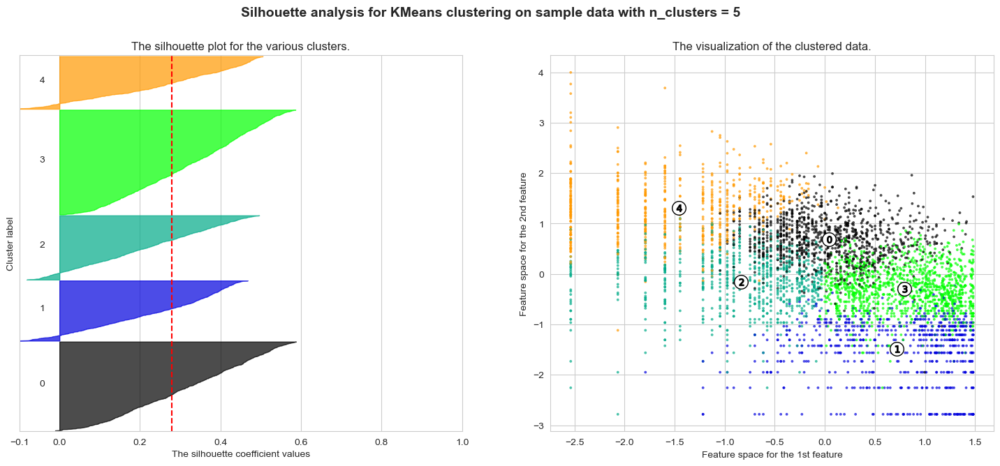

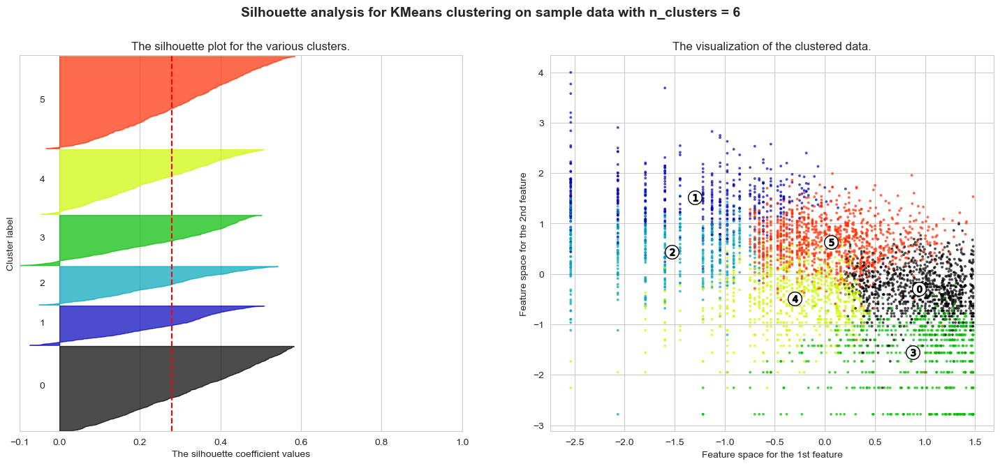

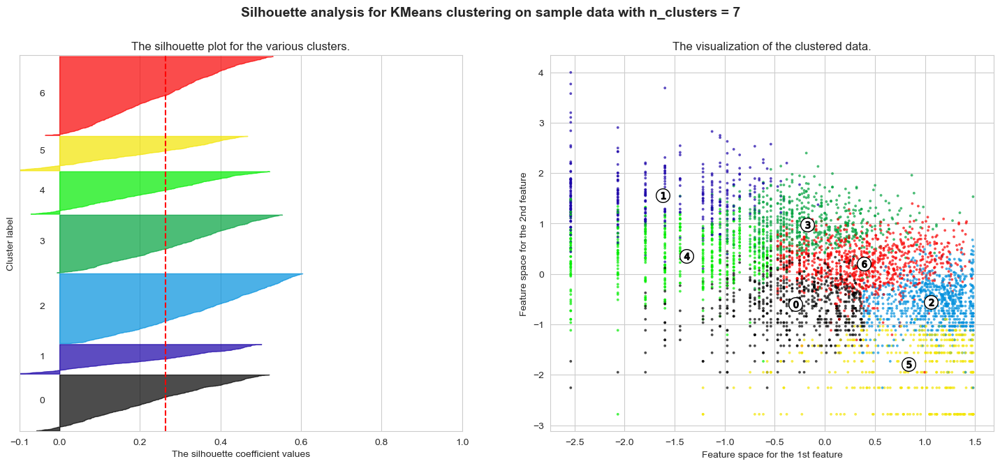

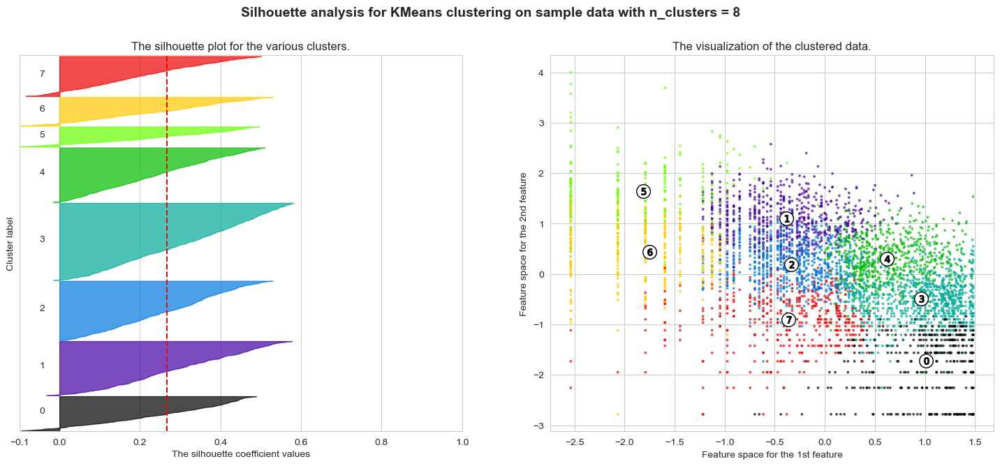

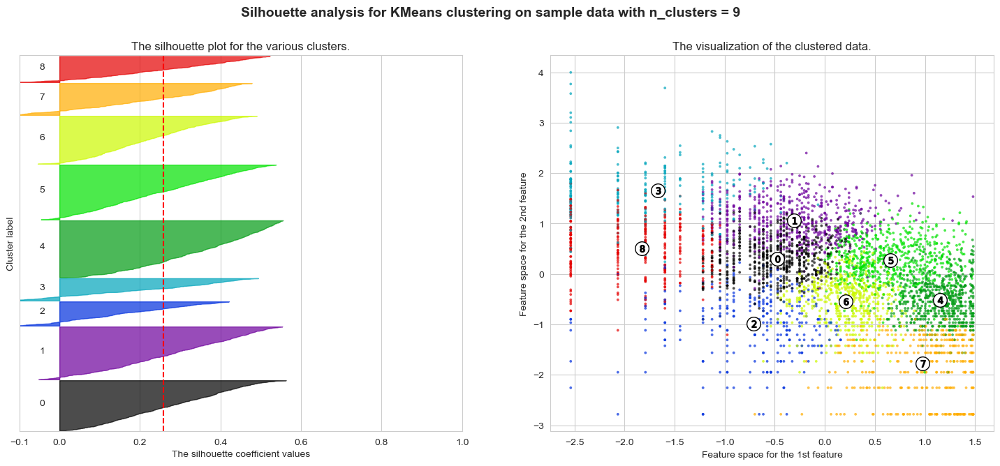

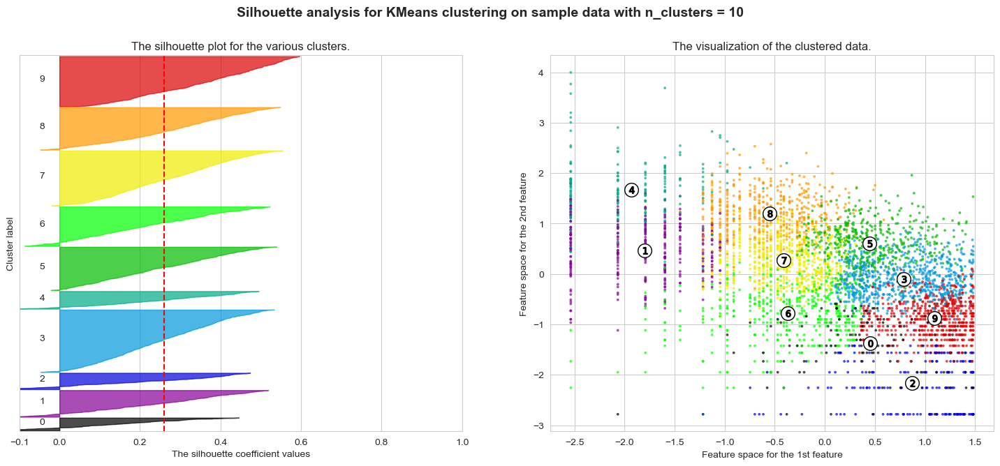

In [76]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

#applying silhouette method on RFM
range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this all lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_clusterScaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_clusterScaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_clusterScaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_clusterScaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
    
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) /n_clusters)
    ax2.scatter(df_clusterScaled[:, 0], df_clusterScaled[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()
        
        
        
# Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

In [77]:
#add cluster label as a new column
df_cluster['Cluster']=cluster_label
df_cluster.head(10)

,Log_R,Log_F,Log_M,Cluster
0,0.693,5.204,8.369,0
1,4.317,3.434,7.494,1
2,2.890,4.290,7.472,1
3,5.737,2.833,5.812,2
4,3.584,4.443,7.826,1
5,5.318,1.386,4.489,2
6,5.447,4.060,6.984,1
7,5.366,2.565,6.130,2
8,3.091,4.078,7.941,1
9,3.497,4.875,8.734,0


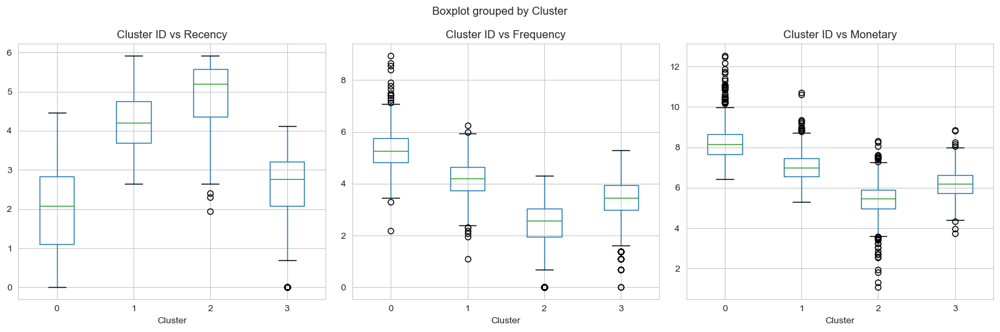

In [78]:
import matplotlib.pyplot as plt
import pandas as pd


# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Box plot for Cluster ID vs Recency
df_cluster.boxplot(column='Log_R', by='Cluster', ax=axes[0])
axes[0].set_title('Cluster ID vs Recency')

# Box plot for Cluster ID vs Frequency
df_cluster.boxplot(column='Log_F', by='Cluster', ax=axes[1])
axes[1].set_title('Cluster ID vs Frequency')

# Box plot for Cluster ID vs Monetary
df_cluster.boxplot(column='Log_M', by='Cluster', ax=axes[2])
axes[2].set_title('Cluster ID vs Monetary')

# Adjust layout
plt.tight_layout()
plt.show()


In [79]:
# calculate mean of each feature for clusters
df_cluster = df_cluster.groupby('Cluster').mean()
df_cluster

,Log_R,Log_F,Log_M
Cluster,,,
0,1.935237,5.316998,8.248923
1,4.250298,4.196378,7.036944
2,4.973349,2.377658,5.423984
3,2.576578,3.413324,6.175867


In [80]:
# We have log-transformed the features now to get more intuition take exponential of each feature
df_cluster = df_cluster.applymap(np.exp)
df_cluster = df_cluster.applymap(int)
df_cluster

,Log_R,Log_F,Log_M
Cluster,,,
0,6,203,3823
1,70,66,1137
2,144,10,226
3,13,30,480


|**Cluster Number**| **RFM Decoding Customer Value** |**Type of Customer**|
|:--------:|:--------:|:--------:|
|0|Bought most recently and most often, and spend the most|Best Customers|
|1|Last bought while ago and less frequent and spend the most|Risky Customers|
|2|Bought long time ago and least frequency and monetary|Churned Customer|
|3|Bought most recently but low frequency and monetary|New Customers|

</br>

## DBSCAN (Density-Based Spatial Clustering of Applications with Noise) Clustering

**[DBSCAN Clustering Algorithm](https://www.analyticsvidhya.com/blog/2020/09/how-dbscan-clustering-works/#:~:text=DBSCAN%20requires%20only%20two%20parameters,classified%20as%20a%20Core%20point.)**</br>
K-Means and Hierarchical Clustering struggle with creating clusters of complex shapes and adapting to varying densities. In contrast, DBSCAN excels by grouping densely packed data points into clusters and effectively identifying clusters in large spatial datasets based on local density.</br>
The most exciting feature of DBSCAN clustering is that it is robust to outliers.

In [81]:
df_clusterScaled

array([[-2.06658152e+00,  1.16054770e+00,  1.41835454e+00],
       [ 3.93073233e-01, -1.80688607e-01,  7.23820703e-01],
       [-5.75449762e-01,  4.67954489e-01,  7.06358138e-01],
       ...,
       [-1.21615453e+00, -8.99803441e-01, -1.11133613e+00],
       [-1.79102417e+00,  2.20398408e+00,  8.26214834e-01],
       [ 9.85909588e-05,  4.36128543e-01,  7.41283268e-01]])

-1     124
 0    4169
 1      44
Name: DBSCAN_Cluster, dtype: int64


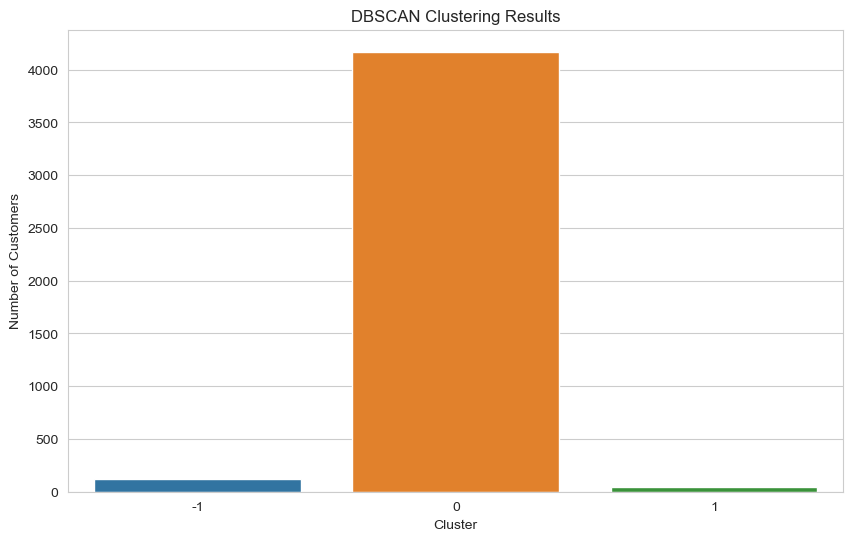

In [82]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Select features for DBSCAN
#df_dbscan = df_rfm[['Log_R', 'Log_F', 'Log_M']]

# Standardize the features
#scaler = StandardScaler()
#df_dbscan_scaled = scaler.fit_transform(df_dbscan)

# Initialize DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=9)  # Adjust eps and min_samples based on your data

# Fit and predict clusters
cluster_labels = dbscan.fit_predict(df_clusterScaled)

# Add cluster labels to the original dataset
df_rfm['DBSCAN_Cluster'] = cluster_labels

# Count the number of customers in each cluster
cluster_counts = df_rfm['DBSCAN_Cluster'].value_counts().sort_index()

# Display cluster counts
print(cluster_counts)

# Plot the distribution of clusters
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values)
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.title('DBSCAN Clustering Results')
plt.show()


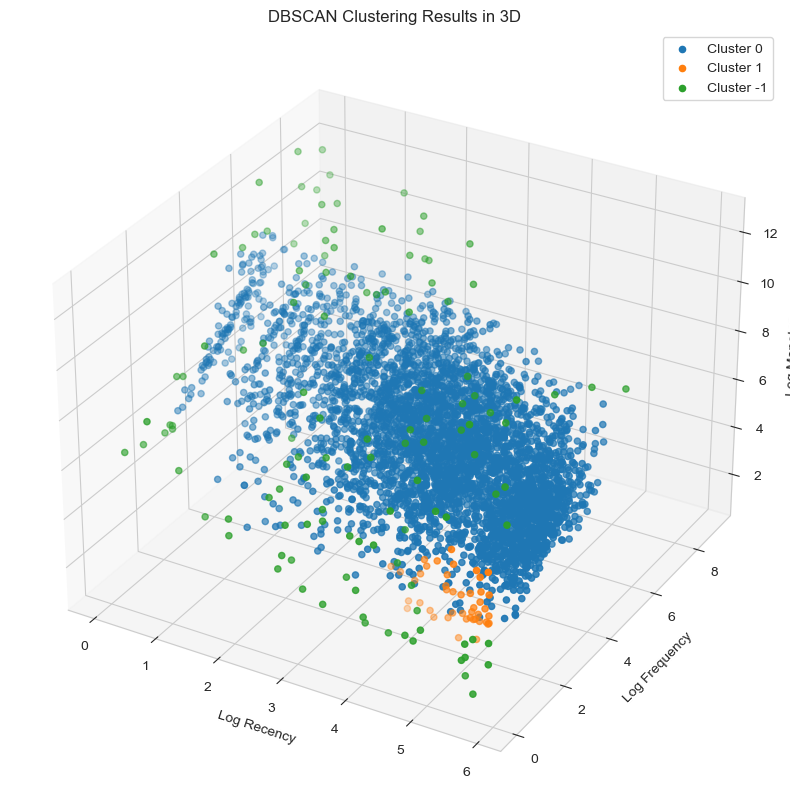

In [83]:
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot of the clusters
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Extract cluster labels and corresponding data
cluster_labels = df_rfm['DBSCAN_Cluster']
x = df_rfm['Log_R']
y = df_rfm['Log_F']
z = df_rfm['Log_M']

# Create a scatter plot for each cluster
for cluster_id in set(cluster_labels):
    cluster_mask = (cluster_labels == cluster_id)
    ax.scatter(x[cluster_mask], y[cluster_mask], z[cluster_mask], label=f'Cluster {cluster_id}')

# Set labels and title
ax.set_xlabel('Log Recency')
ax.set_ylabel('Log Frequency')
ax.set_zlabel('Log Monetary')
ax.set_title('DBSCAN Clustering Results in 3D')
ax.legend()

plt.show()


In [84]:
df_rfm.head()

,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM_Score,RFM,Log_R,Log_F,Log_M,DBSCAN_Cluster
CustomerID,,,,,,,,,,,,
12347.0,2,182,4310.00,4,1,1,6,411,0.693,5.204,8.369,0
12348.0,75,31,1797.24,2,3,1,6,231,4.317,3.434,7.494,0
12349.0,18,73,1757.55,3,2,1,6,321,2.890,4.290,7.472,0
12350.0,310,17,334.40,1,4,3,8,143,5.737,2.833,5.812,0
12352.0,36,85,2506.04,3,2,1,6,321,3.584,4.443,7.826,0


In [85]:
# Calculate the mean of each feature for clusters
cluster_means = df_rfm.groupby('DBSCAN_Cluster')[['Recency', 'Frequency', 'Monetary']].mean()

# Print the cluster means
print(cluster_means)


                   Recency   Frequency      Monetary
DBSCAN_Cluster                                      
-1               61.645161  396.040323  21853.746774
 0               91.347325   82.412089   1420.666600
 1              245.386364    1.000000    203.000909


In [86]:
# Take exponential of log-transformed features
cluster_means_original_scale = cluster_means.applymap(np.exp)
cluster_means_original_scale=cluster_means.applymap(int)


# Print the cluster means in the original scale
print(cluster_means_original_scale)
print('cluster_counts')
print(cluster_counts)



                Recency  Frequency  Monetary
DBSCAN_Cluster                              
-1                   61        396     21853
 0                   91         82      1420
 1                  245          1       203
cluster_counts
-1     124
 0    4169
 1      44
Name: DBSCAN_Cluster, dtype: int64


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/pandas/core/frame.py:9651: RuntimeWarning: overflow encountered in exp
  return lib.map_infer(x.astype(object)._values, func, ignore_na=ignore_na)


|**Cluster Number**| **RFM Decoding Customer Value** |**Type of Customer**|
|:--------:|:--------:|:--------:|
|-1|Bought most recently and most often, and spend the most|Best Customers|
|0|Last bought while ago and less frequent and spend the most|Risky Customers|
|1|Bought long time ago and least frequency and monetary|Churned Customer|


## Gaussian Mixture Models (GMM)

[Gaussian Mixture Models](https://www.analyticsvidhya.com/blog/2019/10/gaussian-mixture-models-clustering/#h-introduction-to-gaussian-mixture-models-gmms) is a statistical model that represents data as a combination of multiple Gaussian distributions. It assumes that the data is generated from a mix of these distributions, each characterized by its own average, spread, and weight. GMMs are used for tasks like clustering and data modeling. They assign probabilities to data points belonging to each Gaussian component and find the best parameters through the Expectation-Maximization (EM) algorithm. This makes GMMs valuable for understanding complex datasets with hidden patterns or clusters.

In [87]:
df_rfm.shape

(4337, 12)

In [88]:
df_clusterScaled

array([[-2.06658152e+00,  1.16054770e+00,  1.41835454e+00],
       [ 3.93073233e-01, -1.80688607e-01,  7.23820703e-01],
       [-5.75449762e-01,  4.67954489e-01,  7.06358138e-01],
       ...,
       [-1.21615453e+00, -8.99803441e-01, -1.11133613e+00],
       [-1.79102417e+00,  2.20398408e+00,  8.26214834e-01],
       [ 9.85909588e-05,  4.36128543e-01,  7.41283268e-01]])

[0 1 3 ... 2 0 3]
0     591
1     788
2    1058
3    1900
Name: GMM_Cluster, dtype: int64


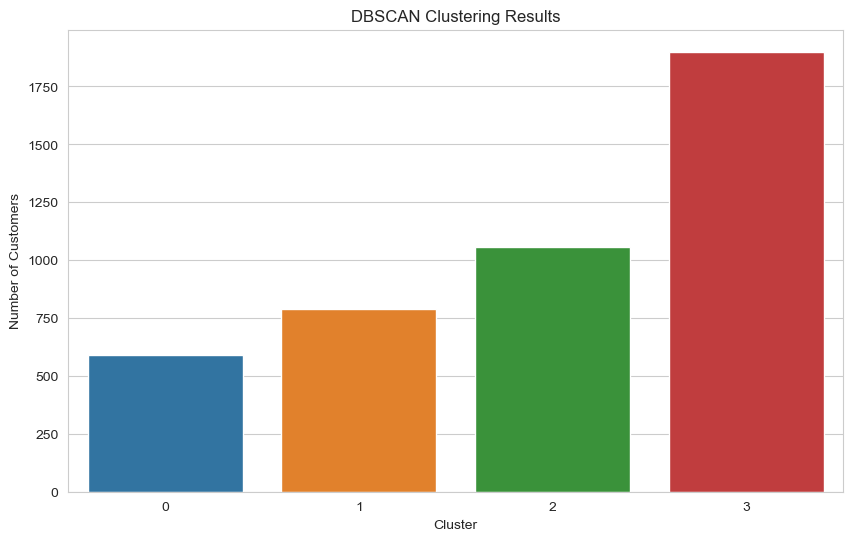

In [89]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture


# Initialize Gaussian Mixture Model
#n_components = 4  # Number of clusters you want to identify
gmm = GaussianMixture(n_components=4)

# Fit the GMM model
gmm.fit(df_clusterScaled)

# Predict cluster labels for each data point
cluster_label_GMM = gmm.predict(df_clusterScaled)
print(cluster_label_GMM)


# Add cluster labels to the original dataset
df_rfm['GMM_Cluster'] = cluster_label_GMM

# Count the number of customers in each cluster
cluster_countGMM = df_rfm['GMM_Cluster'].value_counts().sort_index()

# Display cluster counts
print(cluster_countGMM)


# Plot the distribution of clusters
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_countGMM.index, y=cluster_countGMM.values)
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.title('DBSCAN Clustering Results')
plt.show()




In [90]:
df_rfm.head()

,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM_Score,RFM,Log_R,Log_F,Log_M,DBSCAN_Cluster,GMM_Cluster
CustomerID,,,,,,,,,,,,,
12347.0,2,182,4310.00,4,1,1,6,411,0.693,5.204,8.369,0,0
12348.0,75,31,1797.24,2,3,1,6,231,4.317,3.434,7.494,0,1
12349.0,18,73,1757.55,3,2,1,6,321,2.890,4.290,7.472,0,3
12350.0,310,17,334.40,1,4,3,8,143,5.737,2.833,5.812,0,3
12352.0,36,85,2506.04,3,2,1,6,321,3.584,4.443,7.826,0,3


In [91]:
# Calculate the mean of each feature for clusters
cluster_meansGMM = df_rfm.groupby('GMM_Cluster')[['Recency', 'Frequency', 'Monetary']].mean()

# Print the cluster means
print(cluster_meansGMM)


                Recency   Frequency     Monetary
GMM_Cluster                                     
0              8.548223  260.576988  8141.402555
1            185.036802   24.625635   926.433477
2             34.420605   91.454631   701.900803
3            111.573684   64.507368  1240.708502


In [92]:

# Calculate the mean of each feature for clusters
cluster_means_GMM = df_rfm.groupby('GMM_Cluster')[['Recency', 'Frequency', 'Monetary']].mean()

# Print the cluster means
print(cluster_means_GMM)



                Recency   Frequency     Monetary
GMM_Cluster                                     
0              8.548223  260.576988  8141.402555
1            185.036802   24.625635   926.433477
2             34.420605   91.454631   701.900803
3            111.573684   64.507368  1240.708502


In [93]:

# Take exponential of log-transformed features
cluster_means_scale_GMM = cluster_means_GMM.applymap(np.exp)
cluster_means_scale_GMM=cluster_means_GMM.applymap(int)


# Print the cluster means in the original scale
print(cluster_means_scale_GMM)
print('cluster_counts of GMM')
print(cluster_countGMM)



             Recency  Frequency  Monetary
GMM_Cluster                              
0                  8        260      8141
1                185         24       926
2                 34         91       701
3                111         64      1240
cluster_counts of GMM
0     591
1     788
2    1058
3    1900
Name: GMM_Cluster, dtype: int64


/Users/senakaya/anaconda3/envs/customer_segment/lib/python3.8/site-packages/pandas/core/frame.py:9651: RuntimeWarning: overflow encountered in exp
  return lib.map_infer(x.astype(object)._values, func, ignore_na=ignore_na)


|**Cluster Number**| **RFM Decoding Customer Value** |**Type of Customer**|
|:--------:|:--------:|:--------:|
|0|Bought most recently and most often, and spend the most|Best Customers|
|1|Bought long time ago and least frequency and monetary|Churned Customer|
|2|Bought most recently but low frequency and monetary|New Customers|
|3|Last bought while ago and less frequent and spend the most|Risky Customers|